# The stability of the global average on different window lengths
This notebook outllines different methods that can be used to de-trend the LongRunMIP and ZECMIP time series.

In [1]:
# Standard Library Imports
import os
import sys
from typing import List, Any, Callable, Union, Tuple, Optional
from importlib import reload
from time import sleep
# Third-Party Library Imports
import numpy as np
import pandas as pd
import dask
import xarray as xr
# import climtas
from typing import NamedTuple
from enum import Enum
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MaxNLocator
import cartopy.crs as ccrs
from functools import partial
from glob import glob
import cftime
import string
from numpy.typing import ArrayLike
# Custom Module Imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'zecmip_stabilisation'))
import constants
sys.path.append(constants.MODULE_DIR)
import open_zecmip
import utils
# import signal_to_noise as sn
import plotting_functions
import xarray_extender as xe
import zec_calculation_functions
import signal_to_noise_calculations as sn_calc

# import drift_functions
import sn_plotting
import my_stats
# import signal_to_noise_calculations as sn_calc

# import sn_plotting_utils
# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=RuntimeWarning, module='dask.*')
warnings.filterwarnings("ignore", category=Warning)
# # Logging
# logger = utils.get_notebook_logger()

Matplotlib created a temporary cache directory at /jobfs/126061253.gadi-pbs/matplotlib-bqvzkx8p because the default path (/home/563/ab2313/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
from PyEMD import EEMD

In [3]:
from scipy.stats import spearmanr
from matplotlib.colors import BoundaryNorm
from scipy.stats import linregress
from matplotlib import ticker as mticker
import pymannkendall as mk

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from sklearn.metrics import r2_score
import scipy.stats as stats
import seaborn as sns
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from matplotlib.colors import BoundaryNorm, LinearSegmentedColormap
from scipy import stats

In [4]:
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'list_xarray'))
# from listXarray import listXarray
# import listXarray as lxr
from listXarray import listXarray, where, apply_ufunc, read_listxarray
# reload(lxr)
# from listXarray import array_function

In [5]:
# import listXarray
# reload(listXarray)
# from listXarray import listXarray

In [6]:
np.set_printoptions(precision=2, suppress=True, edgeitems=1)
xr.set_options(display_expand_data=False)

In [7]:
# client.close()

In [8]:
from dask.distributed import Client
client = Client(memory_limit=None, threads_per_worker=1, n_workers=12)
client

- State start
- Found stale lock file and directory '/jobfs/126061253.gadi-pbs/dask-scratch-space/scheduler-qgjzee3v', purging
-   Scheduler at:     tcp://127.0.0.1:33047
-   dashboard at:         /proxy/8787/status
- Registering Worker plugin shuffle
-         Start Nanny at: 'tcp://127.0.0.1:40327'
-         Start Nanny at: 'tcp://127.0.0.1:36725'
-         Start Nanny at: 'tcp://127.0.0.1:42835'
-         Start Nanny at: 'tcp://127.0.0.1:42105'
-         Start Nanny at: 'tcp://127.0.0.1:36647'
-         Start Nanny at: 'tcp://127.0.0.1:45137'
-         Start Nanny at: 'tcp://127.0.0.1:33455'
-         Start Nanny at: 'tcp://127.0.0.1:43319'
-         Start Nanny at: 'tcp://127.0.0.1:35577'
-         Start Nanny at: 'tcp://127.0.0.1:33197'
-         Start Nanny at: 'tcp://127.0.0.1:41203'
-         Start Nanny at: 'tcp://127.0.0.1:42831'
- Register worker <WorkerState 'tcp://127.0.0.1:44601', name: 1, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 12
Total threads: 12,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33047,Workers: 12
Dashboard: /proxy/8787/status,Total threads: 12
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:46093,Total threads: 1
Dashboard: /proxy/33269/status,Memory: 0 B
Nanny: tcp://127.0.0.1:40327,


# Calculations

In [9]:
ecs_dict = {
    'NorESM2-LM': 2.54,
    'MIROC-ES2L': 2.7,
    'MPI-ESM1-2-LR': 2.83,
    'GISS-E2-1-G-CC': 2.9,
    'GFDL-ESM4': 3.1,
    'ACCESS-ESM1-5': 3.87,
    'CESM2': 5.1,
    'UKESM1-0-LL': 5.4,
    'CanESM5': 5.7
}

# This comes from the ZEC nat var paper
tcre_dict = {
    'ACCESS-ESM1-5': 1.81,
    'CESM2': 2.01,
    'CanESM5': 2.10,
    'GFDL-ESM4': 1.36,
    'GISS-E2-1-G-CC': 1.68,
    'MIROC-ES2L': 1.36,
    'MPI-ESM1-2-LR': 1.65,
    'NorESM2-LM': 1.42,
    'UKESM1-0-LL': 2.65
}

## Opening Data

In [10]:
# Looking at all models, vs ensemble mean
# ukesm_tsmean = my_stats.space_mean(a1_raw_data.isel(model='UKESM1-0-LL')).compute()

# ukesm_tsmean = ukesm_tsmean.resample(time='Y').mean()

# ukesm_tsmean.plot(hue='ensemble', alpha=0.5, color='grey')
# ukesm_tsmean.mean(dim='ensemble').plot()

In [11]:
chunks = {'lat':-1, 'lon':-1, 'time':-1, 'ensemble':-1}

In [12]:
chunks_model_based = {
    'ACCESS-ESM1-5': {'time':-1, 'lat':int(145/4), 'lon':int(192/2)},   # too big
    'CESM2': {'time':-1, 'lat':int(145/4), 'lon':int(192/4)},
    'CanESM5': {'time':-1, 'lat':int(64/4), 'lon':int(128/4)},
    'GFDL-ESM4': {'time':-1, 'lat':int(180/3), 'lon':int(144/4)},
    'GISS-E2-1-G-CC': {'time':-1, 'lat':int(90/2), 'lon':int(192/4)},
    'MIROC-ES2L': {'time':-1, 'lat':int(64/2), 'lon':int(128/2)},
    'MPI-ESM1-2-LR': {'time':-1, 'lat':int(96/2), 'lon':int(192/2)},
    'NorESM2-LM': {'time':-1, 'lat':int(96/2), 'lon':int(144/4)},
    'UKESM1-0-LL': {'lat':int(144/8), 'lon':int(192/3), 'time':-1},
}

In [13]:
a1_raw_data = (open_zecmip.extract_experiment_into_xrlist(
    '1000pgc', 'tas', chunks=chunks, logginglevel='ERROR')
                 .to_dataarray('tas')
                 .sort_by_refkey())

In [14]:
pct_raw_data =  (open_zecmip.extract_experiment_into_xrlist('1pct', 'tas', chunks=chunks)
                   .to_dataarray('tas')
                   .sort_by_refkey())

In [197]:
# pi-Control (not ESM)
esmpi_raw_data = (open_zecmip.extract_experiment_into_xrlist('picontrol', 'tas', chunks=chunks, logginglevel='INFO')
                    .to_dataarray('tas')
                    .isel(ensemble=0)
                    .squeeze('ensemble')
                    .sort_by_refkey()
                    .rename({'latitude':'lat', 'longitude': 'lon'}))

- ACCESS-ESM1-5
-      r1i1p1f1 - /g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316/*.nc
- CanESM5
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r1i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p2f1/Amon/tas/gn/v20190429/*.nc
- MIROC-ES2L
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MIROC/MIROC-ES2L/piControl/r1i1p1f2/Amon/tas/gn/v20190823/*.nc
- UKESM1-0-LL
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MOHC/UKESM1-0-LL/piControl/r1i1p1f2/Amon/tas/gn/v20200828/*.nc
- MPI-ESM1-2-LR
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r1i1p1f1/Amon/tas/gn/v20190710/*.nc
-      r2i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r2i1p1f1/Amon/tas/gn/v20190815/*.nc
- GISS-E2-1-G-CC
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/NASA-GISS/GISS-E2-1-G-CC/piControl/r1i1p1f1/Amon/tas/gn/v2

In [198]:
esmpi_raw_data = esmpi_raw_data.isel(ensemble=0)
esmpi_raw_data = esmpi_raw_data - 273.15
esmpi_data = esmpi_raw_data.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
# Can see this in the global mean time series. But this has errors after 1000
esmpi_data['CanESM5'] = esmpi_data['CanESM5'].isel(time=slice(None, 1000))

In [15]:
# Making sure that the ensembles match. NOTE -  this can not be done
# with the piControl
a1_raw_data = a1_raw_data.cross_match_dim(pct_raw_data, 'ensemble')
pct_raw_data = pct_raw_data.cross_match_dim(a1_raw_data, 'ensemble')

In [16]:
a1_raw_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'ensemble': 1, 'model': 1, 'time': 1212, 'lat': 145, 'lon': 192})
              (Array: 128.72, Chunk: 128.72Mib) ({'ensemble': (1,), 'model': (1,), 'time': (1212,), 'lat': (145,), 'lon': (192,)})
CESM2          (dataArray): ({'ensemble': 1, 'model': 1, 'time': 1800, 'lat': 192, 'lon': 288})
              (Array: 379.69, Chunk: 126.56Mib) ({'ensemble': (1,), 'model': (1,), 'time': (600, 600, 600), 'lat': (192,), 'lon': (288,)})
CanESM5        (dataArray): ({'ensemble': 3, 'model': 1, 'time': 1200, 'lat': 64, 'lon': 128})
              (Array: 112.50, Chunk: 37.5Mib) ({'ensemble': (1, 1, 1), 'model': (1,), 'time': (1200,), 'lat': (64,), 'lon': (128,)})
GFDL-ESM4      (dataArray): ({'ensemble': 1, 'model': 1, 'time': 2400, 'lat': 180, 'lon': 288})
              (Array: 474.61, Chunk: 237.3Mib) ({'ensemble': (1,), 'model': (1,), 'time': (1200, 1200), 'lat': (180,), 'lon': (288,)})
GISS-E2-1-G-CC (dataArray): ({'ensemble': 1,

In [17]:
# We are just looking at a single ensemble here.
a1_raw_data = a1_raw_data.isel(ensemble=0)
pct_raw_data = pct_raw_data.isel(ensemble=0)

In [18]:
# Convert to celcius
a1_raw_data = a1_raw_data - 273.15
pct_raw_data = pct_raw_data - 273.15

In [19]:
# Can remove a lot of data, as I don't actually need this past the 70 year mark
# Data is montly so times by 12, a do 100 points just for saftery
pct_raw_data = pct_raw_data.isel(time=slice(0, 100 * 12))

In [20]:
# Yearly data transfomration - montly resolution is not needed
pct_data = pct_raw_data.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')
a1_full_data = a1_raw_data.chunk({'time':-1}).resample(time='Y').mean(dim='time').set_refkeys('model')

In [21]:
# Reduce time so that the smalles time densions matches. This is at 101 years
a1_data = a1_full_data.isel(time=slice(None, 100))

In [22]:
dim_order = ['model', 'lat', 'lon', 'time']

In [23]:
a1_full_data = a1_full_data.transpose(*dim_order).compute().chunk(chunks_model_based)

In [24]:
a1_full_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192, 'time': 101})
              (Array: 10.73, Chunk: 1.33Mib) ({'model': (1,), 'lat': (36, 36, 36, 36, 1), 'lon': (96, 96), 'time': (101,)})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288, 'time': 150})
              (Array: 31.64, Chunk: 0.99Mib) ({'model': (1,), 'lat': (36, 36, 36, 36, 36, 12), 'lon': (48, 48, 48, 48, 48, 48), 'time': (150,)})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 100})
              (Array: 3.12, Chunk: 0.2Mib) ({'model': (1,), 'lat': (16, 16, 16, 16), 'lon': (32, 32, 32, 32), 'time': (100,)})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288, 'time': 200})
              (Array: 39.55, Chunk: 1.65Mib) ({'model': (1,), 'lat': (60, 60, 60), 'lon': (36, 36, 36, 36, 36, 36, 36, 36), 'time': (200,)})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144, 'time': 180})
              (Array: 8.90, Ch

In [25]:
a1_data = a1_data.compute().transpose(*dim_order).chunk(chunks_model_based)

# Anomaly Calculation

## Grid Cell Values

In [26]:
branch_point_data = pct_data(
    zec_calculation_functions.isolate_base_period,
    a1_data, logginglevel='INFO')

- <function isolate_base_period at 0x154862024a60> has been called
- ACCESS-ESM1-5


In [27]:
branch_point_mean_data = pct_data(
    zec_calculation_functions.calculate_branch_average,
    a1_data, logginglevel='INFO')

- <function calculate_branch_average at 0x154862024af0> has been called
- ACCESS-ESM1-5


In [28]:
branch_point_anom_data = branch_point_data - branch_point_mean_data

In [29]:
# Amomaly time series from the branch point (previosuly called 'experiment_zec_da_anom')
a1_anom_data = (a1_data - branch_point_mean_data)#.compute()

In [30]:
# These two can be computed as they are small (combined is around  100mb with each 
# model being around 7mb
a1_anom_data = a1_anom_data.compute()
pct_data = pct_data.compute()

## Space Mean

In [31]:
# # The global weighted mean
# pct_smean_xrlist = pct_resample_data.apply(my_stats.space_mean)
# a1_smean_xrlist = a1_xrlist.apply(my_stats.space_mean)
# # esmpi_smean_xrlist = esmpi_xrlist.apply(my_stats.space_mean)

In [32]:
# Space mean calculations
a1_smean_data = a1_data.apply(my_stats.space_mean).compute()
pct_smean_data = pct_data.apply(my_stats.space_mean).compute()

model
model


In [199]:
esmpi_smean_data = esmpi_data(my_stats.space_mean).compute()

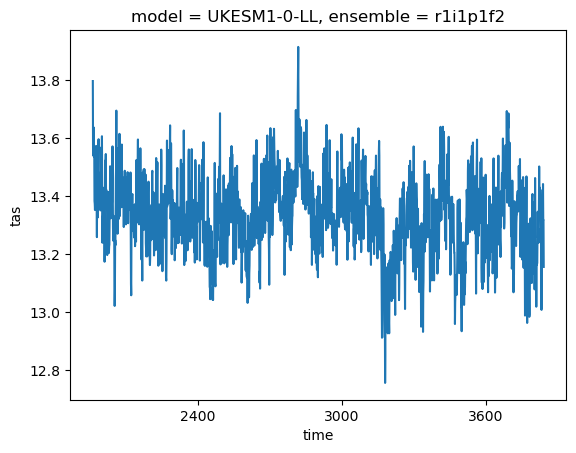

In [200]:
esmpi_smean_data[-1].plot()

In [33]:
a1_full_smean_data = a1_full_data.apply(my_stats.space_mean).compute()

model


In [34]:
# Get the data fror each branch point
branch_point_smean_data = pct_smean_data(
    zec_calculation_functions.isolate_base_period,
    a1_smean_data, logginglevel='INFO')

- <function isolate_base_period at 0x154862024a60> has been called
- ACCESS-ESM1-5


In [35]:
to_list = []
for model in a1_full_smean_data.model:
    a1_full_smean_da = a1_full_smean_data.sel(model=model)
    a1_full_smean_da['time'] = np.arange(len(a1_full_smean_da.time.values))

    branch_point_smean_da = branch_point_smean_data.sel(model=model).isel(time=slice(0, 10))
    branch_point_smean_da['time'] = np.arange(-10, 0)
    merged_da = xr.concat([branch_point_smean_da, a1_full_smean_da], dim='time')
    to_list.append(merged_da)

a1_full_smean_w_base_data = listXarray(to_list, 'model')

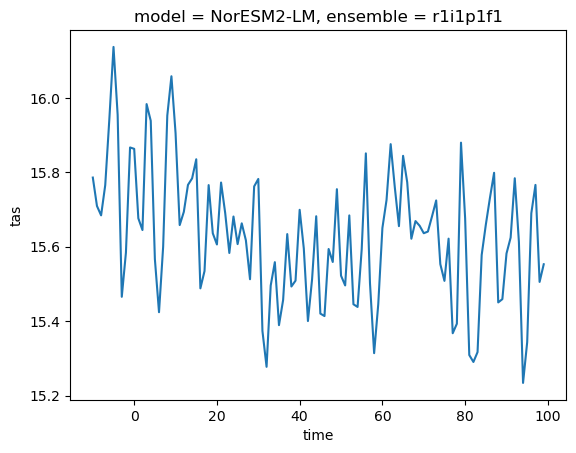

In [36]:
a1_full_smean_w_base_data[-2].plot()

In [37]:
# Get the data fror each branch point
branch_point_15_smean_data = pct_smean_data(
    zec_calculation_functions.isolate_base_period,
    a1_smean_data, selection_length=15, logginglevel='ERROR')

In [38]:
# Get the data fror each branch point
branch_point_20_smean_data = pct_smean_data(
    zec_calculation_functions.isolate_base_period,
    a1_smean_data, selection_length=20, logginglevel='ERROR')

In [39]:
# The base period average
branch_point_mean_smean_data = branch_point_smean_data.mean(dim='time')

In [40]:
branch_point_mean_15_smean_data = branch_point_15_smean_data.mean(dim='time')
branch_point_mean_20_smean_data = branch_point_20_smean_data.mean(dim='time')

In [41]:
# Anomalies by subracting the base period
a1_smean_anom_data = a1_smean_data - branch_point_mean_smean_data

In [42]:
a1_smean_anom_15_data = a1_smean_data - branch_point_mean_15_smean_data
a1_smean_anom_20_data = a1_smean_data - branch_point_mean_20_smean_data

In [43]:
model='UKESM1-0-LL'

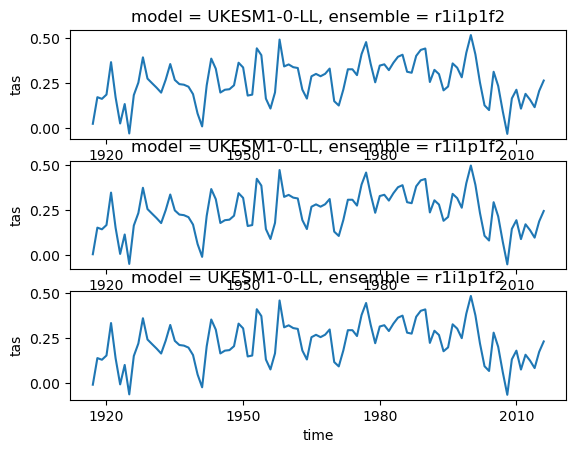

In [44]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1)
a1_smean_anom_data.sel(model=model).plot(ax=ax1)
a1_smean_anom_15_data.sel(model=model).plot(ax=ax2)
a1_smean_anom_20_data.sel(model=model).plot(ax=ax3)

In [45]:
branch_point_smean_anom_data = branch_point_smean_data - branch_point_mean_smean_data

In [46]:
branch_point_smean_anom_t0_da = branch_point_smean_anom_data.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model').drop('ensemble')
a1_smean_anom_t0_da = a1_smean_anom_data.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model').drop('ensemble')

model
model


In [47]:
branch_point_smean_anom_t0_da['time'] = branch_point_smean_anom_t0_da.time.dt.year.values -10
a1_smean_anom_t0_da['time'] = a1_smean_anom_t0_da.time.dt.year.values

In [48]:
a1_pct_data = pct_smean_data(zec_calculation_functions.base_a1_merge, a1_smean_data)

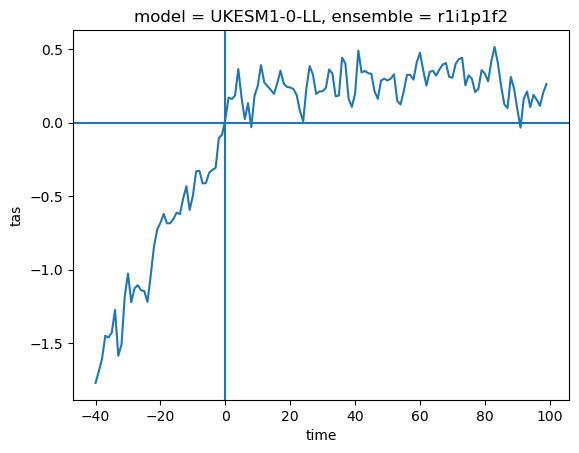

In [49]:
fig = plt.figure()
ax = fig.add_subplot(111)
(a1_pct_data[-1]-branch_point_mean_smean_data[-1].values.item()).plot()
ax.axvline(0)
ax.axhline(0)

# Calculating Forced Response

In [50]:
def calculate_slope(y):
    # Assuming the regression is along the time dimension
    x = np.arange(len(y))
    slope, _, _, _, _ = linregress(x, y)
    return slope

In [51]:
# def calculate_slope_and_intercept(y):
#     # Assuming the regression is along the time dimension
#     x = np.arange(len(y))
#     slope, intercept, _, _, _ = linregress(x, y)
#     return slope, intercept

In [52]:
def fit_line(y):
    # Assuming the regression is along the time dimension
    x = np.arange(len(y))
    slope, intercept, _, _, _ = linregress(x, y)
    
    # Calculate the fitted line
    fitted_line = slope * x + intercept
    
    return fitted_line

In [53]:
def calculate_slope_and_line(y):
    # Assuming the regression is along the time dimension
    x = np.arange(len(y))
    slope, intercept, _, _, _ = linregress(x, y)
    
    # Calculate the fitted line
    fitted_line = slope * x + intercept
    
    return slope, fitted_line

## Global Mean

In [54]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_data = a1_anom_data.isel(time=slice(15, 35)).mean(dim='time').compute()
zec50_data = a1_anom_data.isel(time=slice(40, 60)).mean(dim='time').compute()
zec90_data = a1_anom_data.isel(time=slice(80, 100)).mean(dim='time').compute()
zec50_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144})
MIROC-ES2L     (dataArray): ({'model': 1, 'lat': 64, 'lon': 128})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'lat': 96, 'lon': 192})
NorESM2-LM     (dataArray): ({'model': 1, 'lat': 96, 'lon': 144})
UKESM1-0-LL    (dataArray): ({'model': 1, 'lat': 144, 'lon': 192})

In [247]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_smean_da = a1_smean_anom_data.isel(time=slice(15, 35)).mean(dim='time').concat('model')
zec50_smean_da = a1_smean_anom_data.isel(time=slice(40, 60)).mean(dim='time').concat('model')
zec90_smean_da = a1_smean_anom_data.isel(time=slice(80, 100)).mean(dim='time').concat('model')
zecfinal_smean_da = a1_smean_anom_data.isel(time=slice(-20, None)).mean(dim='time').concat('model')

In [56]:
linear_smean_50_fit_da = xr.apply_ufunc(
    fit_line,
    a1_smean_anom_t0_da.isel(time=slice(0, 50)).squeeze(),
    input_core_dims=[['time']],
    output_core_dims=[['time']],
    vectorize=True
    
)

In [57]:
grad_smean_50_da = xr.apply_ufunc(
    calculate_slope,
    a1_smean_anom_t0_da.isel(time=slice(0, 50)).squeeze(),
    input_core_dims=[['time']],
    output_core_dims=[[]],
    vectorize=True
    
)
forced_smean_50_da = grad_smean_50_da*50

## Grid Cell

In [58]:
a1_anom_data = a1_anom_data.chunk(chunks_model_based)

In [59]:
a1_anom_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'lat': 145, 'lon': 192, 'time': 100})
              (Array: 10.62, Chunk: 1.32Mib) ({'model': (1,), 'lat': (36, 36, 36, 36, 1), 'lon': (96, 96), 'time': (100,)})
CESM2          (dataArray): ({'model': 1, 'lat': 192, 'lon': 288, 'time': 100})
              (Array: 21.09, Chunk: 0.66Mib) ({'model': (1,), 'lat': (36, 36, 36, 36, 36, 12), 'lon': (48, 48, 48, 48, 48, 48), 'time': (100,)})
CanESM5        (dataArray): ({'model': 1, 'lat': 64, 'lon': 128, 'time': 100})
              (Array: 3.12, Chunk: 0.2Mib) ({'model': (1,), 'lat': (16, 16, 16, 16), 'lon': (32, 32, 32, 32), 'time': (100,)})
GFDL-ESM4      (dataArray): ({'model': 1, 'lat': 180, 'lon': 288, 'time': 100})
              (Array: 19.78, Chunk: 0.82Mib) ({'model': (1,), 'lat': (60, 60, 60), 'lon': (36, 36, 36, 36, 36, 36, 36, 36), 'time': (100,)})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'lat': 90, 'lon': 144, 'time': 100})
              (Array: 4.94, Ch

In [60]:
grad_50_data = apply_ufunc(
    calculate_slope,
    a1_anom_data.isel(time=slice(0, 50)).chunk({'time':-1, 'lat':200/4}),  # your xarray.Dataset or DataArray
    input_core_dims=[['time']],  # specify the dimension to apply the function along
    vectorize=True,
    dask='parallelized',
).compute()

forced_50_data  = grad_50_data * 100

In [61]:
grad_data = apply_ufunc(
    calculate_slope,
    a1_anom_data.chunk({'time':-1, 'lat':200/4}),  # your xarray.Dataset or DataArray
    input_core_dims=[['time']],  # specify the dimension to apply the function along
    vectorize=True,
    dask='parallelized',
)

forced_data  = grad_data * 100
forced_50_total_fit_data = grad_data * 50

In [62]:
linear_fit_50_da = apply_ufunc(
    fit_line,
    a1_anom_data.isel(time=slice(0, 50)).chunk({'time':-1, 'lat':200/4}),
    input_core_dims=[['time']],
    output_core_dims=[['time']],
    vectorize=True,
    dask='parallelized'
).compute()

In [63]:
linear_fit_da = apply_ufunc(
    fit_line,
    a1_anom_data.chunk({'time':-1, 'lat':200/4}),
    input_core_dims=[['time']],
    output_core_dims=[['time']],
    vectorize=True,
    dask='parallelized'
).compute()

In [64]:
start_grad_data = apply_ufunc(
    calculate_slope,
    branch_point_data.isel(time=slice(0, 10)),  # your xarray.Dataset or DataArray
    input_core_dims=[['time']],  # specify the dimension to apply the function along
    vectorize=True,
    dask='parallelized',
)

In [65]:
end_grad_data = apply_ufunc(
    calculate_slope,
    branch_point_data.isel(time=slice(10, None)),  # your xarray.Dataset or DataArray
    input_core_dims=[['time']],  # specify the dimension to apply the function along
    vectorize=True,
    dask='parallelized',
)

In [66]:
start_end_grad_diff = start_grad_data - end_grad_data

# Smean Testing

In [67]:
calculate_slope(branch_point_smean_anom_t0_da.isel(model=-1).isel(time=slice(0, 10)).values)

0.03505240731541917

In [68]:
calculate_slope(branch_point_smean_anom_t0_da.isel(model=-1).isel(time=slice(10, None)).values)

0.03975785647822682

In [69]:
branch_point_smean_anom_t0_da.isel(model=-1).isel(time=slice(10, None)).mean().values.item()

0.31326788139656114

In [70]:
branch_point_smean_anom_t0_da.isel(model=-1).isel(time=slice(0, 10)).mean().values.item()

-0.3132678813965635

In [71]:
uk_slope = calculate_slope(a1_smean_anom_t0_da.isel(model=-1).isel(time=slice(0, 50)).values)
uk_slope

0.002919725533687435

In [72]:
uk_slope * 50

0.14598627668437175

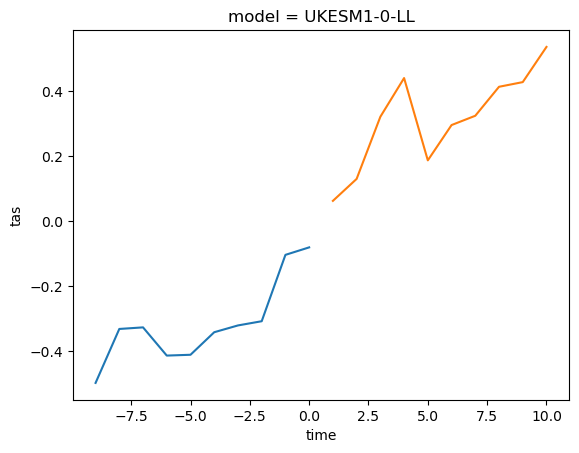

In [73]:
branch_point_smean_anom_t0_da.isel(model=-1).isel(time=slice(0, 10)).plot()
branch_point_smean_anom_t0_da.isel(model=-1).isel(time=slice(10, None)).plot()

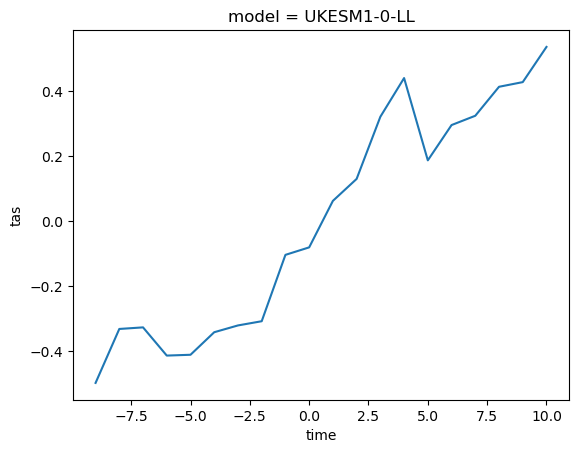

In [74]:
branch_point_smean_anom_t0_da.isel(model=-1).plot()

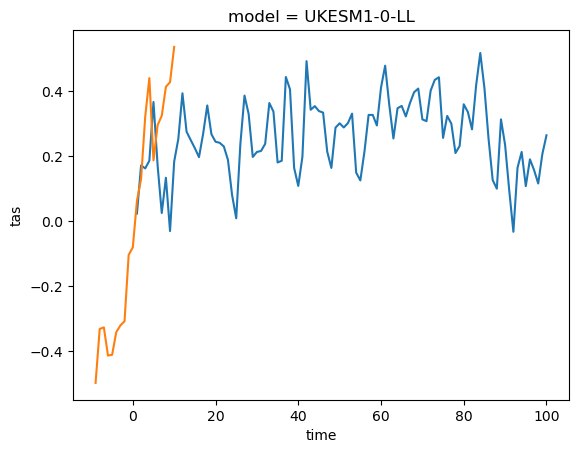

In [75]:
a1_smean_anom_t0_da.isel(model=-1).isel(time=slice(0, 100)).plot()
branch_point_smean_anom_t0_da.isel(model=-1).plot()

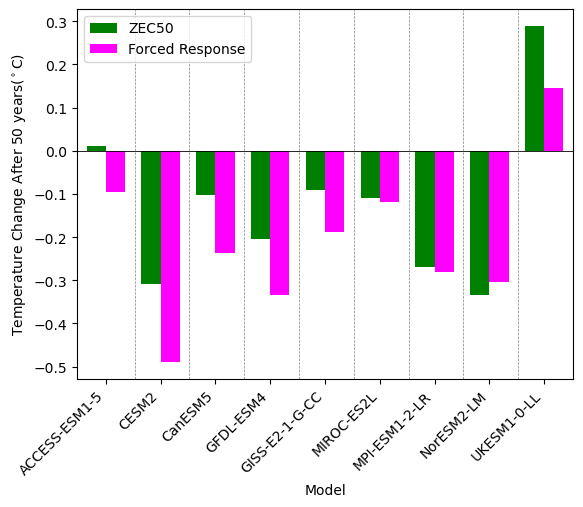

In [76]:
# Example data (you can replace this with your actual data)
x_values = zec50_smean_da.model.values  # Assuming x-values are based on the 'model' dimension
y1 = zec50_smean_da.values  # Data from zec25_smean_da
y2 = forced_smean_50_da.values  # Data from forced_slope_50_data

# Create an array for the x-axis positions
x = np.arange(len(x_values))

# Set up the bar width
bar_width = 0.35

# Create the plot
fig, ax = plt.subplots()

# Plot the bars for each dataset
bars1 = ax.bar(x - bar_width/2, y1, bar_width, label='ZEC50', color='green')
bars2 = ax.bar(x + bar_width/2, y2, bar_width, label='Forced Response', color='magenta')

# Add labels and title
ax.set_xlabel('Model')
ax.set_ylabel('Temperature Change After 50 years' + r'($^\circ$C)')
# ax.set_title('Comparison of ZEC50 Smean and Forced Slope 50 Data')
ax.set_xticks(x)
ax.set_xticklabels(x_values, rotation=45, ha='right')
ax.legend()

ax.axhline(0, color='k', linewidth=0.6)

# Add vertical lines between each bar set for better model division
for pos in x:
    ax.axvline(x=pos+bar_width*3/2, color='gray', linestyle='--', linewidth=0.5)



ax.set_xlim(x[0]-bar_width*3/2, x[-1]+bar_width*3/2);
# ax.grid()

0 ACCESS-ESM1-5
1 CESM2
2 CanESM5
3 GFDL-ESM4
4 GISS-E2-1-G-CC
5 MIROC-ES2L
6 MPI-ESM1-2-LR
7 NorESM2-LM
8 UKESM1-0-LL


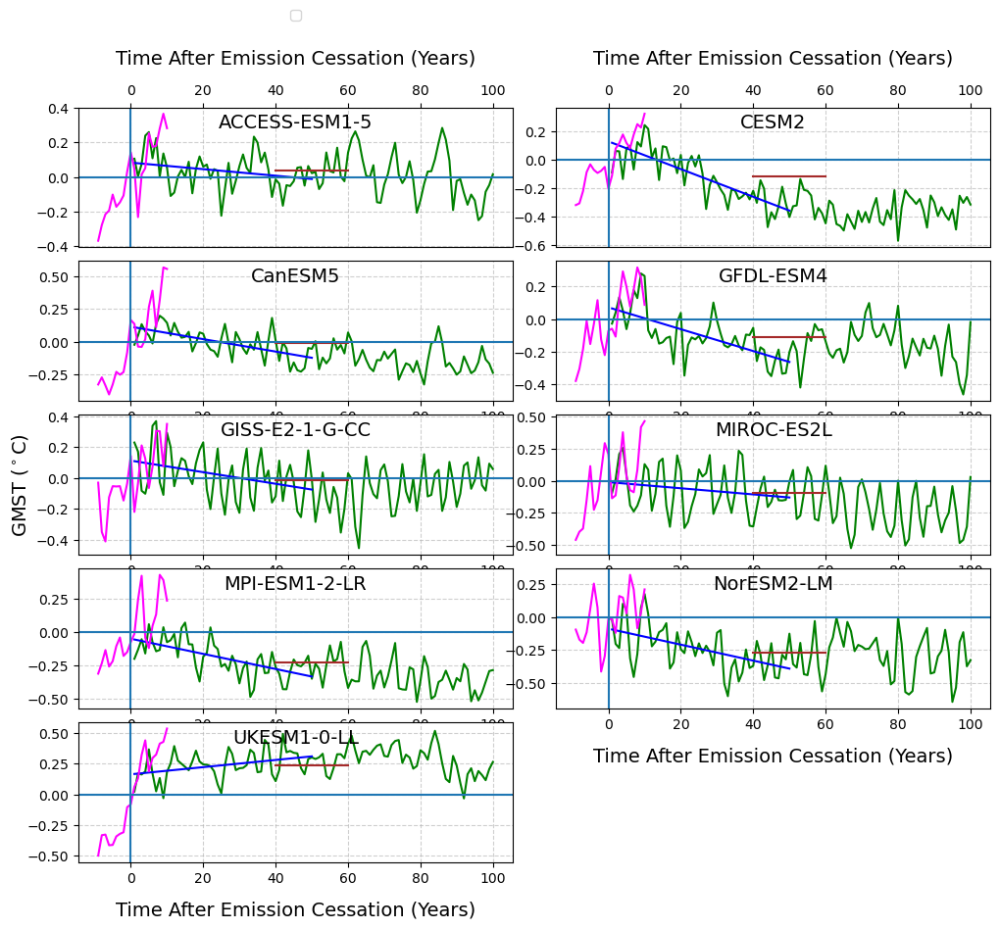

In [77]:
models = pct_smean_data.model

ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.1, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    print(num, model)
    ax = axes[num]
    a1_smean_anom_t0_da.sel(model=model).isel(time=slice(0, 100)).plot(ax=ax, color='green')
    linear_smean_50_fit_da.sel(model=model).plot(ax=ax, color='blue')
    branch_point_smean_anom_t0_da.sel(model=model).plot(ax=ax, color='magenta')
    
    zec50_model_val = zec25_smean_da.sel(model=model).squeeze().values.item()
    forced_slope_50_model = forced_smean_50_da.sel(model=model).squeeze().values.item()

    
    ax.plot([40, 60], np.tile(zec50_model_val,2),  color='brown')
    
    ax.grid(True, linestyle='--', alpha=0.6)

    ax.set_title('')


    # plot_model_data(axes[num], model, ds_pct, a1_smean_xrlist[model])
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    # if model == 'UKESM1-0-LL': axes[num].set_ylim(15.5, 16.87)
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    # Add y-axis label to the middle left subplot
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    else:
         ax.set_ylabel('')

    if num in [0, 1]:
        axes[num].xaxis.set_label_position('top')
        axes[num].xaxis.tick_top()

    ax.axvline(0)
    ax.axhline(0)
   

# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

# Add x-axis label to the last subplot

for ax_num in [0, 1, -1, -2]:
    ax = axes[ax_num]
    ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', 
                  fontsize=14, labelpad=25 if ax_num<0 else 12)

# axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
# axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

In [78]:

def plot_zecmip_data(ax, a1_model_subset, pct_model_subset, zec50_anom, zec25_anom):
    branch_year = a1_model_subset.time.values[0].year
    base_period_years =  np.arange(branch_year-10, branch_year+10)
    
    pct_brach_subset = pct_model_subset.sel(
        time=pct_model_subset.time.dt.year.isin(base_period_years))

    a1_time = np.arange(0, len(a1_model_subset.time.values))
    pct_time = np.arange(-10, 10)
    
    base_period_mean = pct_brach_subset.mean(dim='time').values
    
    
    ax.plot(
        a1_time,
        # a1_model_subset.time.values,
        np.tile(base_period_mean, len(a1_model_subset.time.values)),
        linestyle='--', color='k', label='Base Period Average')
    
    ax.plot(pct_time, pct_brach_subset.values, color='magenta', label='Base Period',
           # linestyle='--', marker='o'
           )
    
    ax.plot(a1_time, a1_model_subset.values, color='green', linewidth=2, label='A1')

    #### ZEC50
    zec50_loc = a1_model_subset.isel(time=slice(40, 60)).mean().values
    # zec50_val= zec50_loc
    ax.plot(np.arange(40, 60),
            np.tile(zec50_loc, 20),
            color='blue', linewidth=2)
    if zec50_loc < base_period_mean: ytrans = -0.2
    else: ytrans = 0.2
    ax.annotate(f'{zec50_anom:.2f}', xy=(50,zec50_loc+ytrans), ha='center', color='blue')

    ### ZEC25
    zec25_loc = a1_model_subset.isel(time=slice(15, 35)).mean().values
    # zec50_val= zec50_loc
    ax.plot(np.arange(15, 35),
            np.tile(zec25_loc, 20),
            color='brown', linewidth=2)
    if zec25_loc < base_period_mean: ytrans = -0.2
    else: ytrans = 0.2
    ax.annotate(f'{zec25_anom:.2f}', xy=(25,zec25_loc+ytrans), ha='center', color='brown')
    
    
    ax.axvline(0, label='Branch Point')
    
    ### Styling
    ax.grid(True, linestyle='--', color='grey', alpha=0.5)

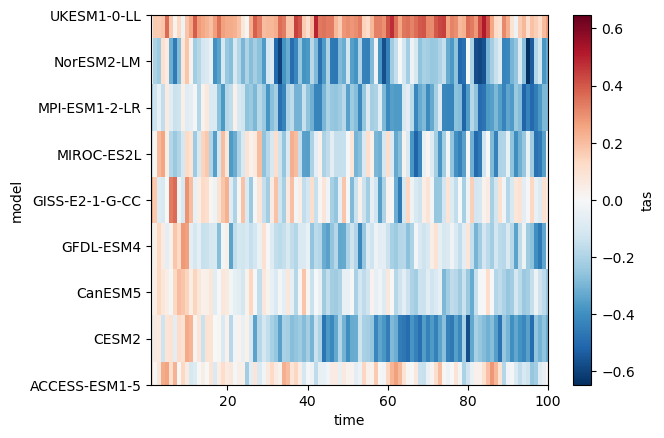

In [79]:
a1_smean_anom_t0_da.isel(time=slice(0, 100)).squeeze().plot()

Text(0.5, 0, 'Time After Emission Cessation (Years)')

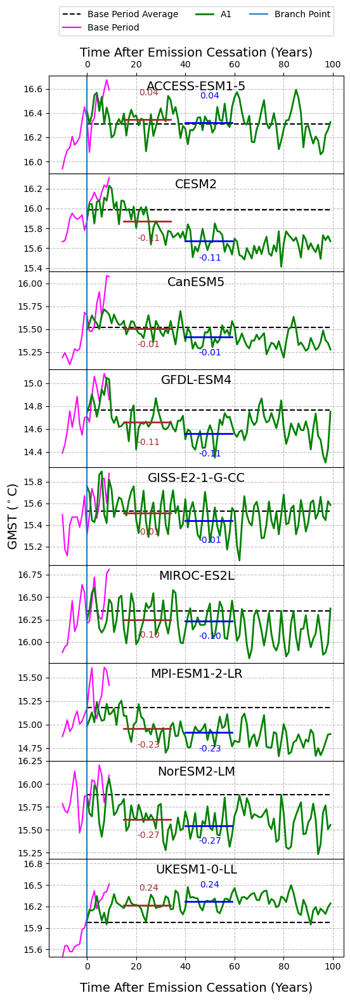

In [80]:
models = pct_smean_data.model

ncols = 1
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    plot_zecmip_data(axes[num], a1_smean_data[model].squeeze(), pct_smean_data[model].squeeze(),
                    zec25_smean_da.sel(model=model).values.item(), zec25_smean_da.sel(model=model).values.item())
    # plot_model_data(axes[num], model, ds_pct, a1_smean_xrlist[model])
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    if model == 'UKESM1-0-LL': axes[num].set_ylim(15.5, 16.87)
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    # Add y-axis label to the middle left subplot
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)

    if num == 0:
        axes[num].xaxis.set_label_position('top')
        axes[num].xaxis.tick_top()
    


# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

# Add x-axis label to the last subplot
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

Text(0.5, 0, 'Time After Emission Cessation (Years)')

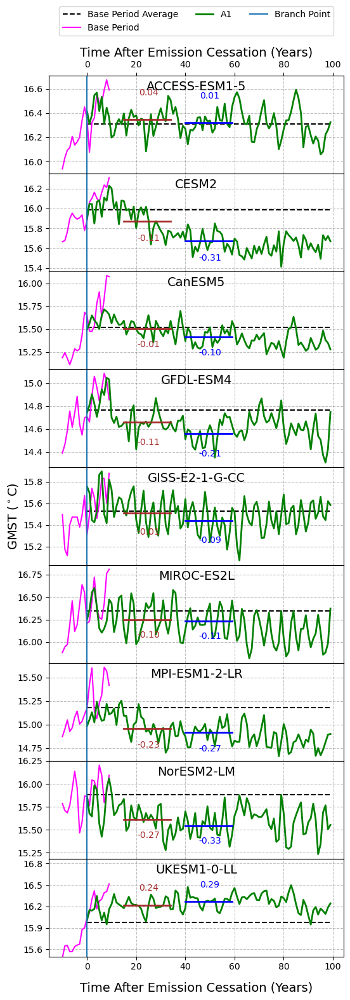

In [81]:
# ncols = 2
# nrows = int(np.ceil(len(models)/ncols))

# fig = plt.figure(figsize=(6*ncols, 2*nrows))
# gs = gridspec.GridSpec(nrows, ncols, hspace=0.2, wspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(9)]

ncols = 1
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.refkeys):
    plot_zecmip_data(axes[num], a1_smean_data[model].squeeze(), pct_smean_data[model].squeeze(),
                    zec50_smean_da.sel(model=model).values.item(), zec25_smean_da.sel(model=model).values.item())
    # plot_model_data(axes[num], model, ds_pct, a1_smean_xrlist[model])
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')

    if model == 'UKESM1-0-LL': axes[num].set_ylim(15.5, 16.87)
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    # Add y-axis label to the middle left subplot
    if num == int(len(models)/2):
        axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)

    if num == 0:
        axes[num].xaxis.set_label_position('top')
        axes[num].xaxis.tick_top()
    


# Place the legend above the first row of plots
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
leg = axes[0].legend(ncol=3, bbox_to_anchor=[0.5, 1.75], loc='upper center', fontsize=10)

# Add x-axis label to the last subplot
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)
axes[0].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=2)

# Testing other Methods

In [82]:
import statsmodels.api as sm
import patsy


In [83]:
model = 'UKESM1-0-LL'

In [84]:
a1_full_smean_data = a1_full_data.apply(my_stats.space_mean).compute()

model


## Hodrick-Prescot (HP filter)

In [85]:
temperatures = a1_full_smean_data[model].squeeze().values
#a1_smean_anom_data[-1].squeeze().values
temperatures.shape

(330,)

In [86]:
cyclical, trend = sm.tsa.filters.hpfilter(temperatures, lamb=1600) 

In [87]:
# sm.tsa.filters.hpfilter?

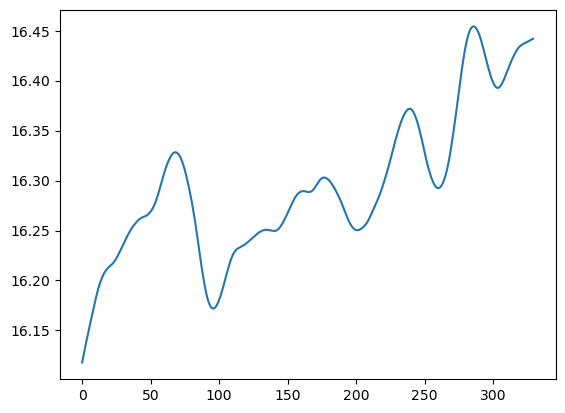

In [88]:
plt.plot(trend)

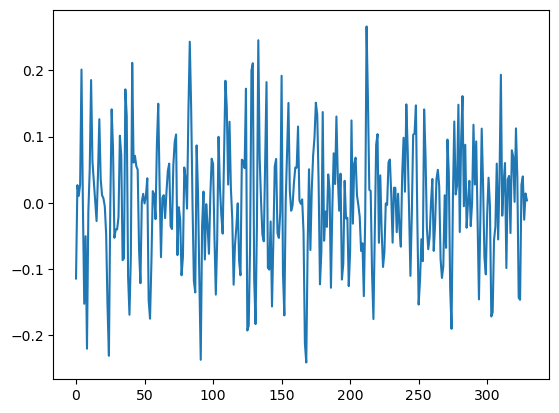

In [89]:
plt.plot(cyclical)

In [90]:
zec50_smean_da.sel(model=model).values.item()

0.2892118302650971

In [91]:
change_in_trend = trend[50] - trend[0]
change_in_trend

0.15109383149208

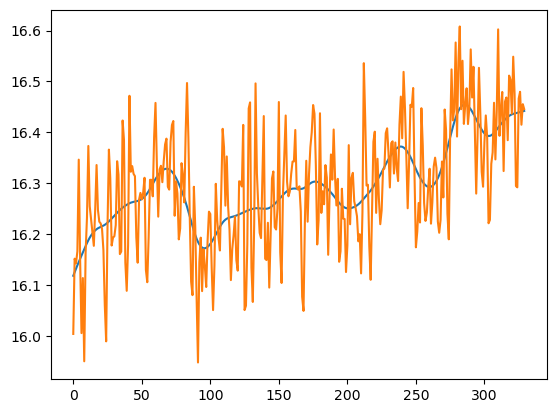

In [92]:
plt.plot(trend)
plt.plot(temperatures)

## Linear Splines

In [93]:
# Example data
# years = np.array([1950, 1951, ..., 2020])  # Replace with actual years
years = np.arange(len(temperatures))
temperatures = temperatures#np.array([...])  # Replace with temperature data

# Define knot positions (e.g., every 20 years)
knots = years[::25]

# Create spline basis
spline_basis = patsy.dmatrix("bs(years, knots=knots, degree=1, include_intercept=True)", {"years": years})

# Fit the model
spline_model = sm.OLS(temperatures, spline_basis)
results = spline_model.fit()

# Get predicted values
predicted_temperatures = results.predict(spline_basis)

In [94]:
# Define knot positions (e.g., every 25 years)
knots = years[::25]

# Calculate midpoints
midpoints = (knots[:-1] + knots[1:]) / 2

# Initialize gradients array
gradients = np.zeros(len(midpoints))

# Calculate gradients at midpoints
for i, midpoint in enumerate(midpoints):
    idx = np.argmin(np.abs(years - midpoint))
    dy = years[1] - years[0]  # Assuming uniform spacing
    gradients[i] = (predicted_temperatures[idx + 1] - predicted_temperatures[idx - 1]) / (2 * dy)

In [95]:
tc1 = gradients[0]*25
tc2 = gradients[1]*25

In [96]:
tc1 + tc2

0.13707805697054098

In [97]:
zec50_smean_da.sel(model='UKESM1-0-LL').values.item()

0.2892118302650971

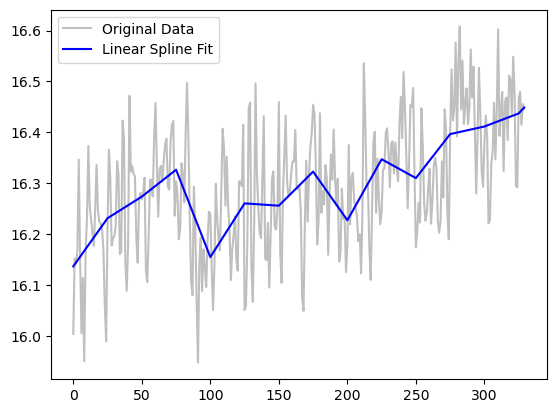

In [98]:
# Plot results
plt.plot(years, temperatures, label="Original Data", color='gray', alpha=0.5)
plt.plot(years, predicted_temperatures, label="Linear Spline Fit", color='blue')
plt.legend()

## Ensemble Empirical Mode Decomposition

In [99]:
from PyEMD import EEMD, EMD, CEEMDAN

In [100]:
def calculate_EMD(da):
    # Extract the signal and time from the input xarray.DataArray
    signal = da.values
    time = da.coords['time'].values  # Use the actual time values from the xarray
    
    # Initialize EMD
    emd = EMD()

    # Perform the decomposition
    IMFs = emd.emd(signal)

    # Create an xarray.DataArray directly from the IMFs
    IMF_da = xr.DataArray(IMFs, dims=["imf", "time"],
                          coords={"imf": np.arange(IMFs.shape[0]), "time": time})

    return IMF_da

In [101]:
def calculate_CEEMDAN(da):
    # Extract the signal and time from the input xarray.DataArray
    signal = da.values
    time = da.coords['time'].values  # Use the actual time values from the xarray
    
    # Initialize EMD
    ceedman = CEEMDAN()

    # Perform the decomposition
    IMFs = ceedman(signal)

    # Create an xarray.DataArray directly from the IMFs
    IMF_da = xr.DataArray(IMFs, dims=["imf", "time"],
                          coords={"imf": np.arange(IMFs.shape[0]), "time": time})

    return IMF_da

In [202]:
esmpi_smean_data[-1].squeeze()

<xarray.DataArray 'tas' (model: 1, time: 1880)> Size: 15kB
13.8 13.54 13.56 13.64 13.54 13.58 13.56 ... 13.17 13.31 13.44 13.32 13.32 13.16
Coordinates:
  * model     (model) <U11 44B 'UKESM1-0-LL'
    ensemble  <U8 32B 'r1i1p1f2'
  * time      (time) object 15kB 1960-12-30 00:00:00 ... 3839-12-30 00:00:00

In [203]:
ceedman_esmpi_da = calculate_CEEMDAN(esmpi_smean_data.squeeze()[-1])

In [108]:
ceedman_data = a1_full_smean_data.squeeze()(calculate_CEEMDAN, logginglevel='INFO ')

- <function calculate_CEEMDAN at 0x1547a6c69870> has been called
- ACCESS-ESM1-5
- CESM2
- CanESM5
- GFDL-ESM4
- GISS-E2-1-G-CC
- MIROC-ES2L
- MPI-ESM1-2-LR
- NorESM2-LM
- UKESM1-0-LL
- Re-attaching key_dim model


In [112]:
emd_data = a1_full_smean_data.squeeze()(calculate_EMD)

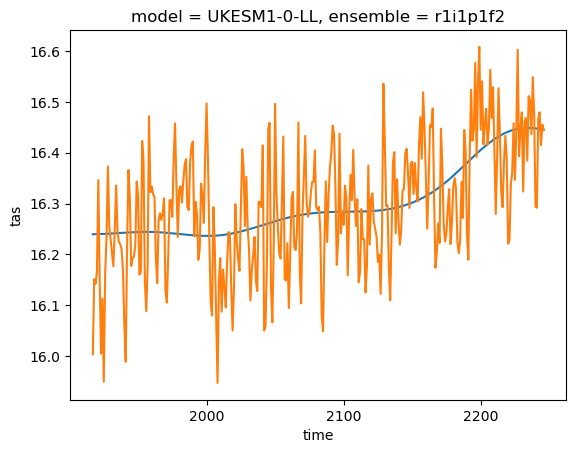

In [115]:
ceedman_da.isel(imf=[-1, -2]).sum(dim='imf').plot()

a1_full_smean_data[-1].squeeze().plot()

In [116]:
imf_data = ceedman_data

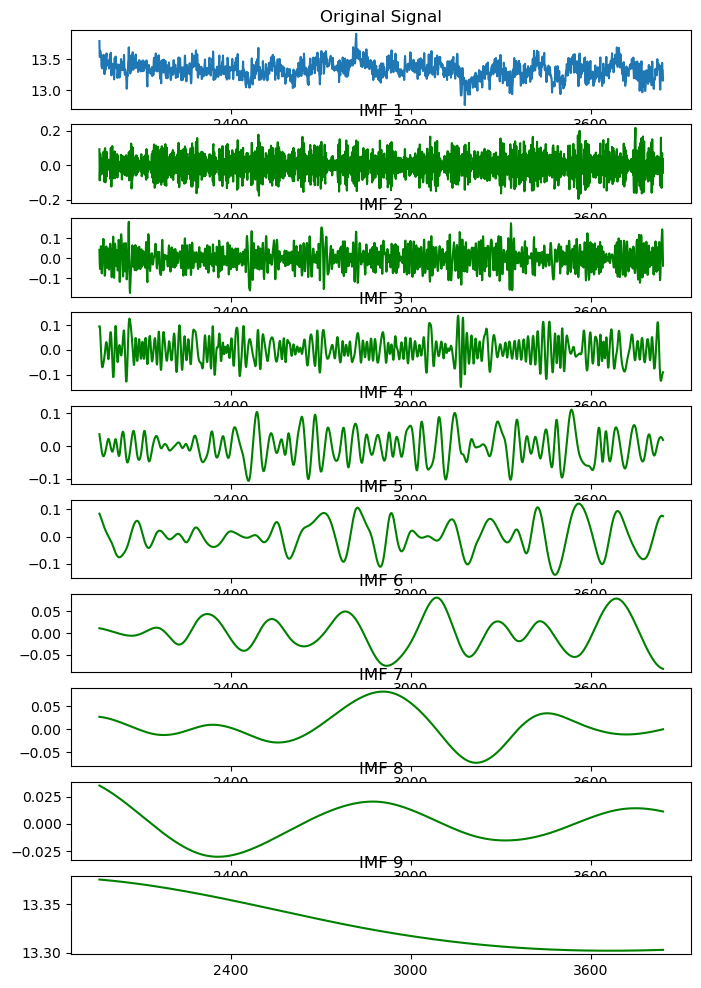

In [209]:
imf_da = ceedman_esmpi_da

# Plot the results
n_imfs = len(imf_da.imf)
fig, axes = plt.subplots(n_imfs + 1, 1, figsize=(8, 12))

# Plot original signal
axes[0].plot(esmpi_smean_data[-1].squeeze().time.values, 
             esmpi_smean_data[-1].squeeze().values)
axes[0].set_title("Original Signal")

# Plot IMFs
for i in range(n_imfs):
    axes[i + 1].plot(imf_da.time.values, imf_da.squeeze().sel(imf=i), color='green')
    # axes[i + 1].plot(enimf_da.time.values, enimf_da.sel(imf=i), color='magenta', alpha=0.6)

    axes[i + 1].set_title(f"IMF {i + 1}")

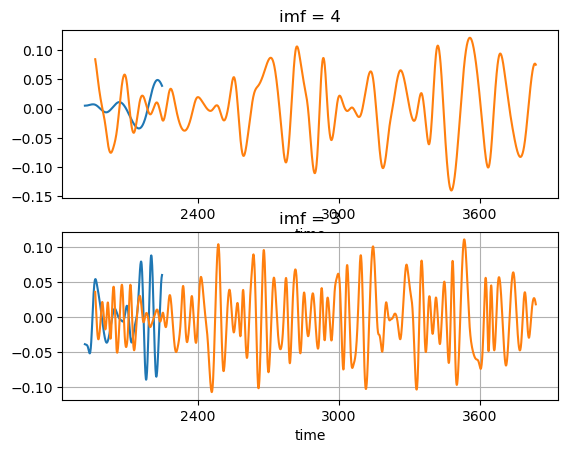

In [225]:
fig, (ax1, ax2) = plt.subplots(2, 1)

ceedman_data[-1].isel(imf=-2).plot(ax=ax1)
ceedman_esmpi_da.isel(imf=-5).plot(ax=ax1)


ceedman_data[-1].isel(imf=-3).plot(ax=ax2)
ceedman_esmpi_da.isel(imf=-6).plot(ax=ax2)

ax2.grid(True)

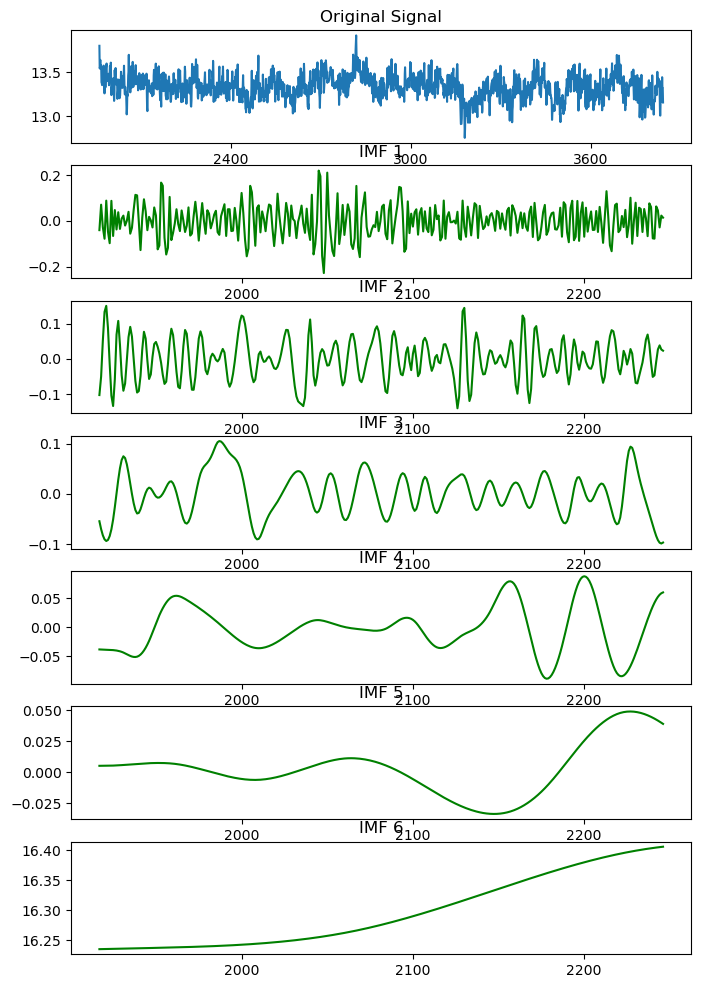

In [205]:
imf_da = ceedman_data[-1]

# Plot the results
n_imfs = len(imf_da.imf)
fig, axes = plt.subplots(n_imfs + 1, 1, figsize=(8, 12))

# Plot original signal
axes[0].plot(a1_full_smean_data[-1].squeeze().time.values, 
             a1_full_smean_data[-1].squeeze().values)
axes[0].set_title("Original Signal")

# Plot IMFs
for i in range(n_imfs):
    axes[i + 1].plot(imf_data[-1].time.values, imf_data[-1]..queeze().sel(imf=i), color='green')
    # axes[i + 1].plot(enimf_da.time.values, enimf_da.sel(imf=i), color='magenta', alpha=0.6)

    axes[i + 1].set_title(f"IMF {i + 1}")

In [156]:
# The potential series is the sum of the residual (last imf) and second last imf
potential_series_data = imf_data.isel(imf=[-1, -2]).sum(dim='imf')
potential_series_data

key_dim = model


Number of da/ds: 9
---------------
ACCESS-ESM1-5  (dataArray): ({'model': 1, 'time': 101})
CESM2          (dataArray): ({'model': 1, 'time': 150})
CanESM5        (dataArray): ({'model': 1, 'time': 100})
GFDL-ESM4      (dataArray): ({'model': 1, 'time': 200})
GISS-E2-1-G-CC (dataArray): ({'model': 1, 'time': 180})
MIROC-ES2L     (dataArray): ({'model': 1, 'time': 248})
MPI-ESM1-2-LR  (dataArray): ({'model': 1, 'time': 185})
NorESM2-LM     (dataArray): ({'model': 1, 'time': 100})
UKESM1-0-LL    (dataArray): ({'model': 1, 'time': 330})

In [157]:
imf50_anom_da = (potential_series_data.isel(time=50).concat('model')-\
                   potential_series_data.isel(time=0).concat('model'))#.values

In [159]:
imf90_anom_da = (potential_series_data.isel(time=90).concat('model')-\
                   potential_series_data.isel(time=0).concat('model'))

In [169]:
imffinal_anom_da = (potential_series_data.isel(time=-1).concat('model')-\
                   potential_series_data.isel(time=0).concat('model'))

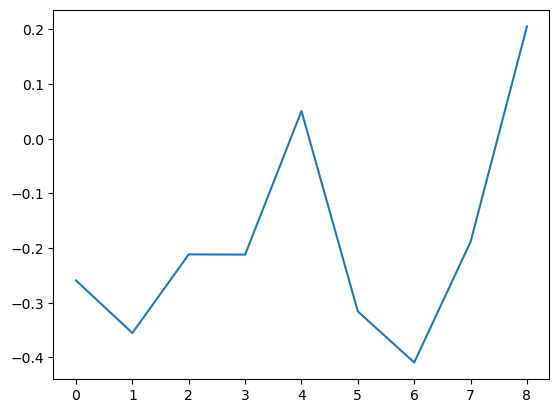

In [176]:
plt.plot(imffinal_anom_da.values)#.plot()

In [163]:
zec50_smean_da = zec50_smean_da.drop('ensemble', errors='ignore').sortby('model')
imf50_anom_da = imf50_anom_da.sortby('model')

In [160]:
zec50_smean_da .min(), zec50_smean_da.max(),zec50_smean_da.median()

(<xarray.DataArray 'tas' ()> Size: 8B
 -0.3344,
 <xarray.DataArray 'tas' ()> Size: 8B
 0.2892,
 <xarray.DataArray 'tas' ()> Size: 8B
 -0.1087)

In [161]:
np.min(imf50_anom_da.values),np.max(imf50_anom_da.values), np.median(imf50_anom_da.values)

(-0.41921448678608364, 0.003675829651609064, -0.18034416245233942)

In [162]:
np.min(imf90_anom_da.values),np.max(imf90_anom_da.values), np.median(imf90_anom_da.values)

(-0.4693432773730919, -0.0027272157445779044, -0.19174081977918433)

In [165]:
zec50_smean_da.median(), zec50_smean_da.mean()

(<xarray.DataArray 'tas' ()> Size: 8B
 -0.1087,
 <xarray.DataArray 'tas' ()> Size: 8B
 -0.1244)

In [166]:
imf50_anom_da.median(), imf50_anom_da.mean()

(<xarray.DataArray ()> Size: 8B
 -0.1803,
 <xarray.DataArray ()> Size: 8B
 -0.1684)

In [303]:
def plot_temperature_change(x_values, y1, y2, c1='magenta', c2='green', year_num=50):
    """
    Plots the temperature change after 50 years for two datasets.

    Parameters:
        x_values (np.ndarray): Array of model names or x-values.
        y1 (np.ndarray): Data array for the first dataset (ZEC50).
        y2 (np.ndarray): Data array for the second dataset (EEMD).
        c1 (str): Color for the first dataset bars (default is 'magenta').
        c2 (str): Color for the second dataset bars (default is 'green').
    """

    # Create an array for the y-axis positions
    y = np.arange(len(x_values))

    # Set up the bar height and text offset
    bar_height = 0.35

    # Create the plot
    fig, ax = plt.subplots()


    ax.barh(9 - bar_height / 2, np.nanpercentile(y1, 75) - np.nanpercentile(y1, 25), 
            bar_height, left=np.nanpercentile(y1, 25), color=c1)
    
    # For y2 dataset (EEMD)
    ax.barh(9 + bar_height / 2, np.nanpercentile(y2, 75) - np.nanpercentile(y2, 25), 
            bar_height, left=np.nanpercentile(y2, 25), color=c2)

    
    ax.plot([np.min(y2), np.max(y2)], [9 + bar_height / 2, 9 + bar_height / 2], color=c2)
    ax.plot([np.min(y1), np.max(y1)], [9 - bar_height / 2, 9 - bar_height / 2], color=c1)



    # Plot the bars for each dataset
    bars1 = ax.barh(y - bar_height / 2, y1, bar_height, label=f'ZEC$_{{{year_num}}}$', color=c1)
    bars2 = ax.barh(y + bar_height / 2, y2, bar_height, label='EEMD', color=c2)

    # Add labels and title
    ax.set_ylabel('Model')
    ax.set_xlabel(f'Temperature Change After {year_num} years' + r'($^\circ$C)')
    y = np.append(y, 9)
    ax.set_yticks(y)
    x_values = np.append(x_values, 'Model Range')
    ax.set_yticklabels(x_values)
    ax.legend(loc='lower right')

    ax.axvline(0, color='k', linewidth=0.6)

    # Add vertical lines between each bar set for better model division
    for pos in y:
        ax.axhline(y=pos + 1.5 * bar_height, color='gray', linestyle='--', linewidth=0.5)

    text_offset_base = 0.07  # Variable for text offset

    for i in range(len(y1)):
        text_offset1 = 0 if y1[i] >= 0 else -text_offset_base
        ax.text(y1[i] + text_offset1, i - bar_height / 2, f"{y1[i]:.2f}", va='center', ha='left', color=c1)

        text_offset2 = 0 if y2[i] >= 0 else -text_offset_base
        ax.text(y2[i] + text_offset2, i + bar_height / 2, f"{y2[i]:.2f}", va='center', ha='left', color=c2)

    ax.set_xlim(-0.55, 0.4)

    ax.vlines(x=np.median(y1), ymin=9 - 0.9 * bar_height, ymax=9, color='k', linewidth=2)
    ax.vlines(x=np.median(y2), ymin=9, ymax=9 + bar_height, color='k', linewidth=2)
    ax.annotate(f'{np.median(y1):.2f}', xy=(np.median(y1), 9 - 3 * bar_height / 2), ha='center', va='center', 
                color=c1)

    ax.annotate(f'{np.median(y2):.2f}', xy=(np.median(y2), 9 + 3 * bar_height / 2), ha='center', va='center', 
                color=c2)

    ax.text(np.max(y1), y[-1] - bar_height / 2, f"{np.max(y1):.2f}", va='center', ha='left', color=c1)
    ax.text(np.min(y1) - text_offset_base, y[-1] - bar_height / 2, f"{np.min(y1):.2f}", va='center',
            ha='left', color=c1)

    ax.set_ylim(y[0] - bar_height * 3 / 2, None)
    ax.text(np.max(y2), y[-1] + bar_height / 2, f"{np.max(y2):.2f}", va='center', ha='left', color=c2)
    ax.text(np.min(y2) - text_offset_base, y[-1] + bar_height / 2, f"{np.min(y2):.2f}", va='center',
            ha='left', color=c2)

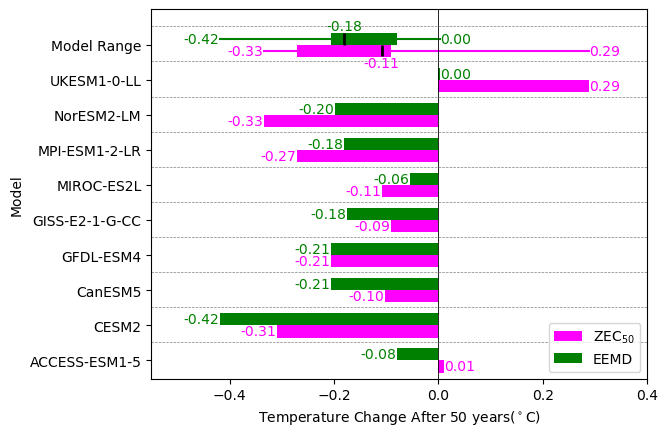

In [304]:
plot_temperature_change(zec50_smean_da.model.values, zec50_smean_da.values, imf50_anom_da.values, 
                        c1='magenta', c2='green')


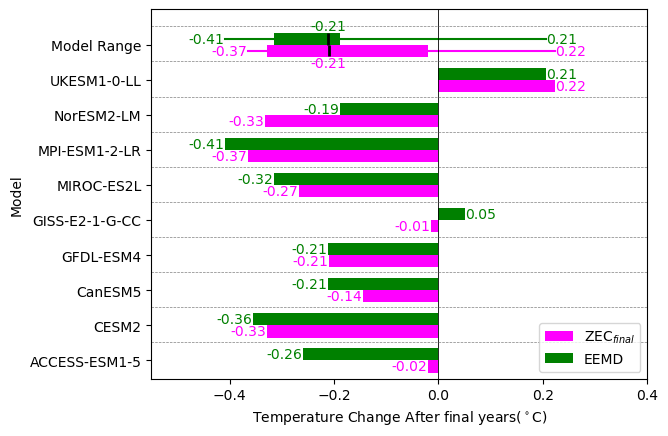

In [305]:
plot_temperature_change(zecfinal_smean_da.model.values, zecfinal_smean_da.values, imffinal_anom_da.values, 
                        c1='magenta', c2='green', year_num='final')


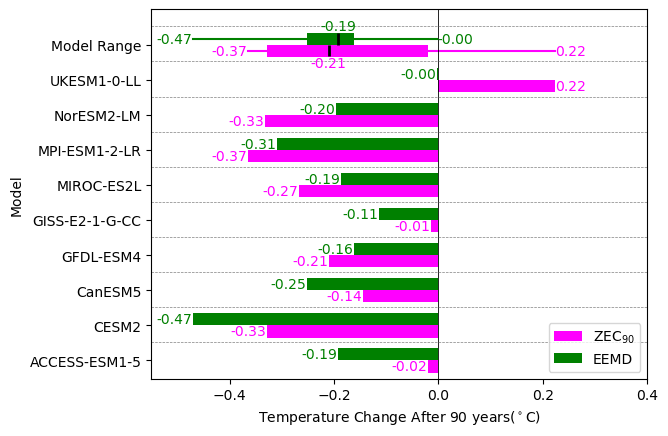

In [308]:
plot_temperature_change(zec90_smean_da.model.values, zec90_smean_da.values, imf90_anom_da.values, 
                        c1='magenta', c2='green', year_num='90')


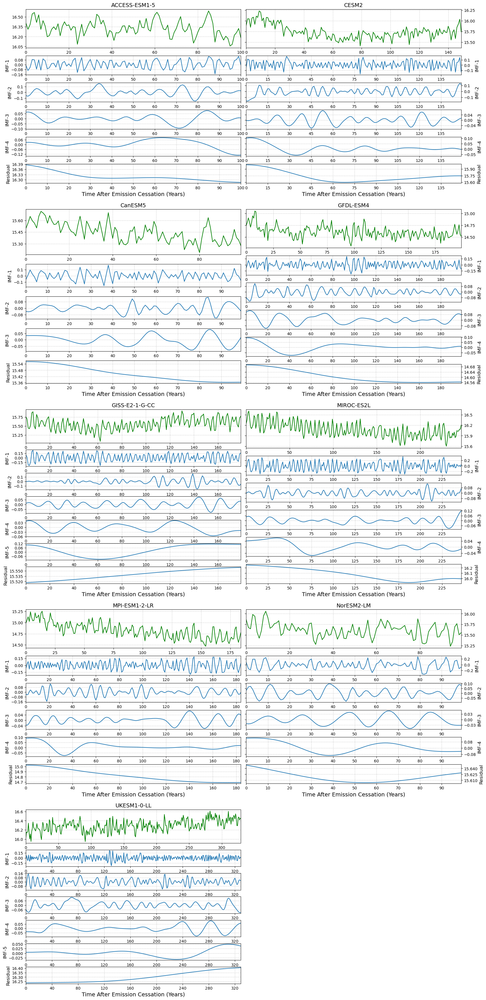

In [154]:
models = imf_data.model

ncols = 2
nrows = int(np.ceil(len(models) / ncols))

fig = plt.figure(figsize=(10 * ncols, 9 * nrows))
gs_outer = gridspec.GridSpec(nrows, ncols, hspace=.15, wspace=.025)

for num, model in enumerate(models):
    
    imf_model_da = imf_data[model]
    num_imfs = len(imf_model_da.imf)

    time_years = np.arange(a1_full_smean_data[model].time.shape[0])

    # Create GridSpec for inner plots (a1 plot + IMFs)
    gs_inner = gridspec.GridSpecFromSubplotSpec(
        num_imfs + 1, 1, subplot_spec=gs_outer[num],
        height_ratios=[1] + [.5] * num_imfs, hspace=0.35)

    # Create the a1 plot
    ax_a1 = fig.add_axes(gs_inner[0].get_position(fig))
    ax_a1.plot(time_years, a1_full_smean_data[model].squeeze().values,
               color='green')
    ax_a1.set_title(model, fontsize=14)
    ax_a1.set_xlim(np.take(time_years, [0, -1]))
    ax_a1.yaxis.set_major_locator(MaxNLocator(4))
    ax_a1.grid(True, linestyle='--', alpha=.6)

    # Create IMF plots
    for i, imf in enumerate(imf_model_da.imf.values):
        ax_imf = fig.add_axes(gs_inner[i + 1].get_position(fig))
        ax_imf.plot(time_years, imf_model_da.squeeze().sel(imf=imf).values)


        ax_imf.set_xlim(np.take(time_years, [0, -1]))
        ax_imf.set_ylabel(f'IMF-{imf + 1}' if imf < num_imfs-1 else 'Residual', fontsize=12)

        ax_imf.xaxis.set_major_locator(MaxNLocator(10))
        ax_imf.yaxis.set_major_locator(MaxNLocator(4))
        
        ax_imf.grid(True, linestyle='--', alpha=.6)
        if num%2:
            ax_imf.yaxis.tick_right()
            ax_imf.spines['right'].set_position(('outward', 0))  # Move it outward by 0 points
            ax_imf.yaxis.set_ticks_position('both')  # Ticks on both left and right sides
            ax_imf.yaxis.set_tick_params(which='both', labelright=True)
            ax_imf.yaxis.set_label_position("right")
            # ax_imf.spines['left'].set_visible(False)


    if num%2:
        ax_a1.yaxis.tick_right()
        ax_a1.spines['right'].set_position(('outward', 0))  # Move it outward by 0 points
        ax_a1.yaxis.set_ticks_position('both')  # Ticks on both left and right sides
        ax_a1.yaxis.set_tick_params(which='both', labelright=True)
        ax_a1.yaxis.set_label_position("right")
        # ax_imf.spines['left'].set_visible(False)

        
    ax_imf.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)

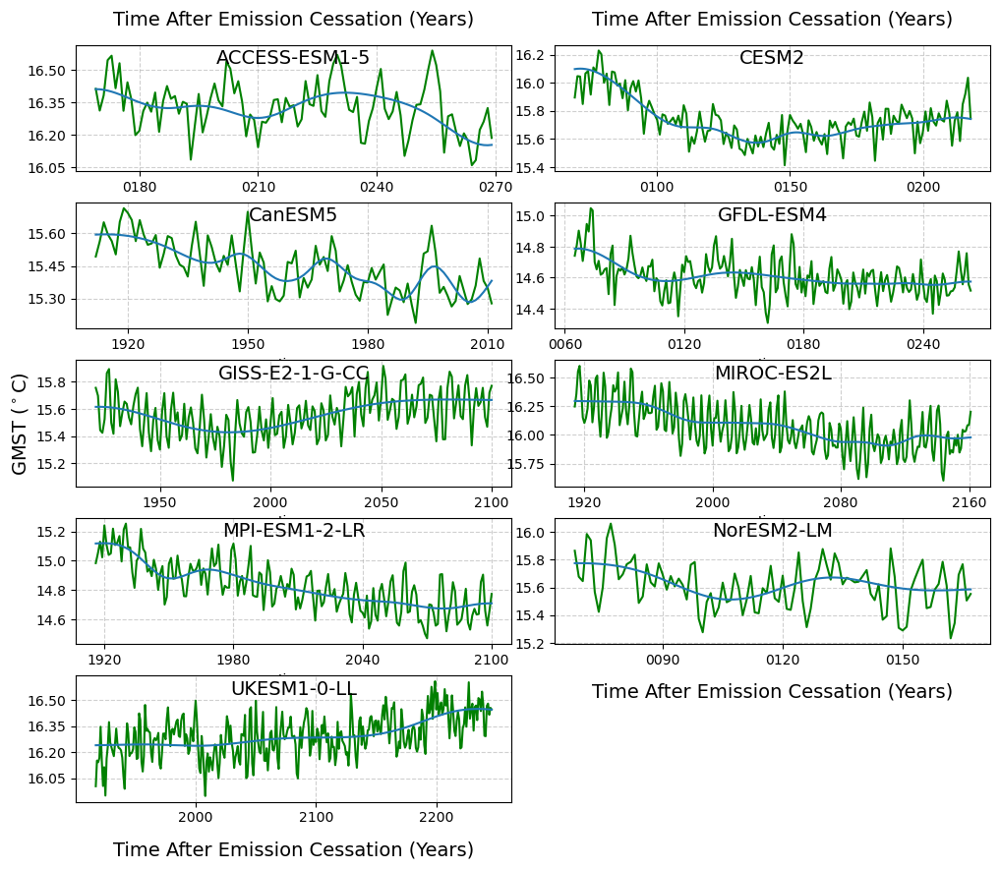

In [168]:
models = pct_smean_data.model

ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.25, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

# Iterate over the models and plot each one using plot_model_data
for num, model in enumerate(pct_smean_data.model):
    ax = axes[num]

    a1_full_smean_data[model].plot(ax=ax, color='green')
    # imf_data[model].isel(imf=[-1, -2]).sum(dim='imf').plot(ax=ax)
    potential_series_data[model].plot(ax=ax)

    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_title('')
    axes[num].annotate(model, xy=(0.5, 0.85), ha='center', fontsize=14, xycoords='axes fraction')
    axes[num].yaxis.set_major_locator(MaxNLocator(nbins=5))
    
    if num == int(len(models)/2): axes[num].set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    else: ax.set_ylabel('')

    if num in [0, 1]:
        axes[num].xaxis.set_label_position('top')

for ax_num in [0, 1, -1, -2]:
    ax = axes[ax_num]
    ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', 
                  fontsize=14, labelpad=25 if ax_num<0 else 12)


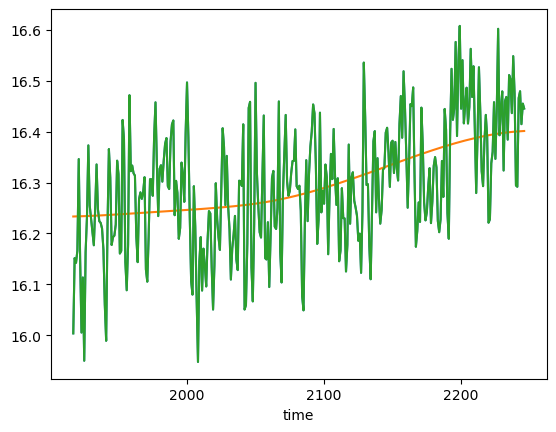

In [205]:
a1_full_smean_data[-1].squeeze().plot()
imf_data[-1].isel(imf=[-1]).sum(dim='imf').plot()
imf_data[-1].sum(dim='imf').plot()

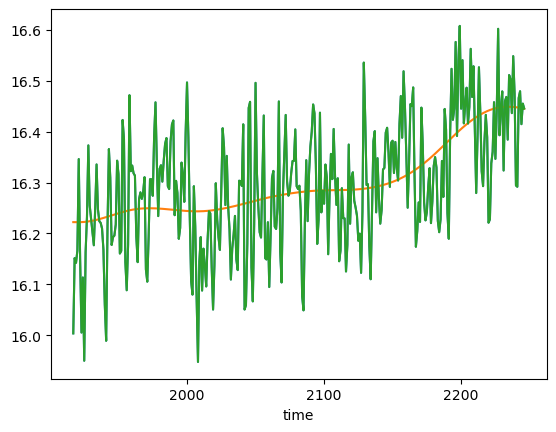

In [206]:
a1_full_smean_data[-1].squeeze().plot()
imf_data[-1].isel(imf=[-1, -2]).sum(dim='imf').plot()
imf_data[-1].sum(dim='imf').plot()

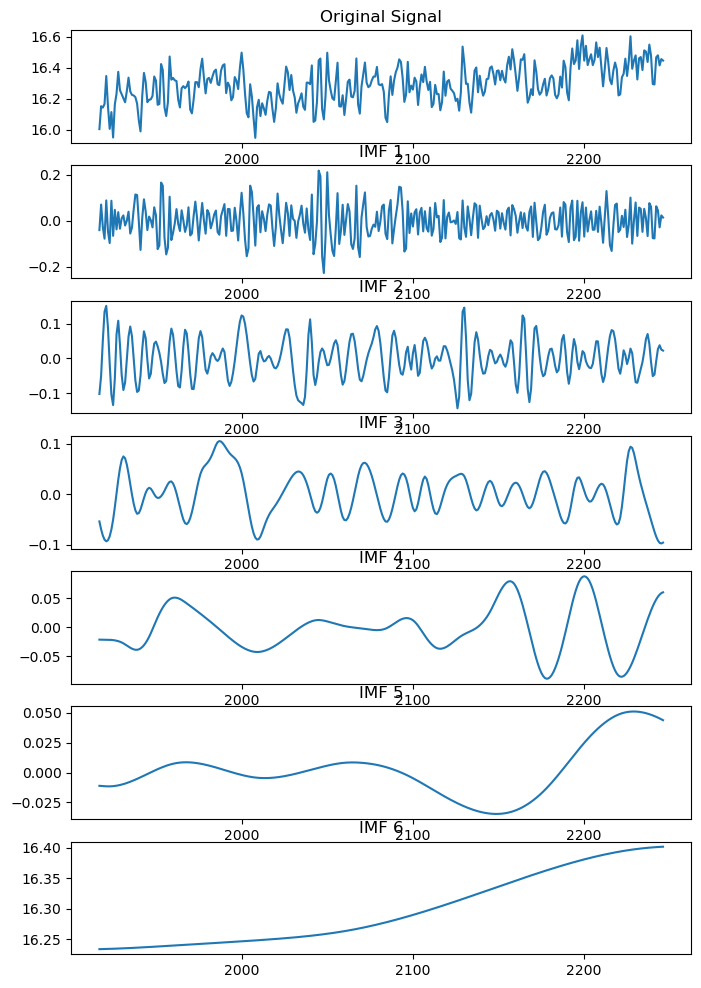

In [207]:
# Plot the results
n_imfs = len(imf_da.imf)
fig, axes = plt.subplots(n_imfs + 1, 1, figsize=(8, 12))

# Plot original signal
axes[0].plot(a1_full_smean_data[-1].squeeze().time.values, a1_full_smean_data[-1].squeeze().values)
axes[0].set_title("Original Signal")

# Plot IMFs
for i in range(n_imfs):
    axes[i + 1].plot(imf_data[-1].time.values, imf_data[-1].sel(imf=i))
    axes[i + 1].set_title(f"IMF {i + 1}")

# Local EMD

In [143]:
def calculate_CEEMDAN_local(signal):
    # Initialize EMD
    ceedman = CEEMDAN()

    # Perform the decomposition
    IMFs = ceedman(signal)

    # Get the last two IMFs
    res = IMFs[-1]
    last_imf = IMFs[-2]

    # Stack them along a new axis (0) to create an array of shape (2, time)
    return np.stack([last_imf, res], axis=0)

In [165]:
client.close()
client = Client(memory_limit=None, threads_per_worker=1, n_workers=20)
client

- Closing Nanny at 'tcp://127.0.0.1:45367'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:44667'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:45125'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:34223'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:41781'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:41609'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:44311'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:37515'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:42901'. Reason: nanny-close
- Nanny 

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 20
Total threads: 20,Total memory: 0 B
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40247,Workers: 20
Dashboard: /proxy/8787/status,Total threads: 20
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:46631,Total threads: 1
Dashboard: /proxy/42157/status,Memory: 0 B
Nanny: tcp://127.0.0.1:37501,


- Connection to tcp://127.0.0.1:47856 has been closed.
- Remove worker <WorkerState 'tcp://127.0.0.1:35857', name: 18, status: running, memory: 2, processing: 1> (stimulus_id='handle-worker-cleanup-1727918817.3725479')
- Removing worker 'tcp://127.0.0.1:35857' caused the cluster to lose already computed task(s), which will be recomputed elsewhere: {('xarray-<this-array>-dc3c02b51bae0f8b9b0fde3767fe2161', 1, 2, 0), ('transpose-beb26157c65fcb9ef1575b2285ea857c', 6, 2, 0, 0)} (stimulus_id='handle-worker-cleanup-1727918817.3725479')
- Connection to tcp://127.0.0.1:47924 has been closed.
- Remove worker <WorkerState 'tcp://127.0.0.1:34675', name: 17, status: running, memory: 1, processing: 2> (stimulus_id='handle-worker-cleanup-1727918817.3795102')
- Removing worker 'tcp://127.0.0.1:34675' caused the cluster to lose already computed task(s), which will be recomputed elsewhere: {('xarray-<this-array>-dc3c02b51bae0f8b9b0fde3767fe2161', 4, 1, 0)} (stimulus_id='handle-worker-cleanup-1727918817.

In [403]:
# a1_full_data = a1_full_data.transpose(*['model','lat', 'lon', 'time'])
# a1_full_data = a1_full_data.compute()

In [160]:
chunks_model_based_tiny = {
    'ACCESS-ESM1-5': {'time':-1, 'lat':int(145/4), 'lon':int(192/2)},   # too big
    'CESM2': {'time':-1, 'lat':int(145/4), 'lon':int(192/4)},
    'CanESM5': {'time':-1, 'lat':int(64/4), 'lon':int(128/4)},
    'GFDL-ESM4': {'time':-1, 'lat':int(180/3), 'lon':int(144/4)},
    'GISS-E2-1-G-CC': {'time':-1, 'lat':int(90/2), 'lon':int(192/4)},
    'MIROC-ES2L': {'time':-1, 'lat':int(64/2), 'lon':int(128/2)},
    'MPI-ESM1-2-LR': {'time':-1, 'lat':int(96/2), 'lon':int(192/2)},
    'NorESM2-LM': {'time':-1, 'lat':int(96/2), 'lon':int(144/4)},
    'UKESM1-0-LL': {'lat':int(144/6), 'lon':int(192/4), 'time':-1},
}

In [166]:
d1 = a1_full_data[0].squeeze().compute().chunk(chunks_model_based_tiny['UKESM1-0-LL'])

In [167]:
# d1 = d1.transpose('lat', 'lon', 'time')

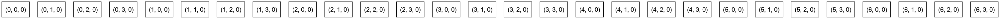

In [168]:
dask.visualize(d1)

In [169]:
d1

<xarray.DataArray 'tas' (lat: 145, lon: 192, time: 101)> Size: 11MB
dask.array<chunksize=(24, 48, 101), meta=np.ndarray>
Coordinates:
  * lat       (lat) float64 1kB -90.0 -88.75 -87.5 -86.25 ... 87.5 88.75 90.0
  * lon       (lon) float64 2kB 0.0 1.875 3.75 5.625 ... 352.5 354.4 356.2 358.1
    model     <U13 52B 'ACCESS-ESM1-5'
    ensemble  <U8 32B 'r1i1p1f1'
  * time      (time) object 808B 0168-12-31 00:00:00 ... 0268-12-31 00:00:00

In [170]:
local_imf_da = xr.apply_ufunc(
    calculate_CEEMDAN_local,
    d1,
    # a1_full_data[0].isel(lat=slice(0,5), lon=slice(0,5)).squeeze(),
    input_core_dims=[['time']],
    output_core_dims=[['imf', 'time']],  # The 'imf' dimension comes first
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float],  # Only one output dtype since both outputs are merged
    dask_gufunc_kwargs={'output_sizes': {'imf': 2}}  # Define the size of the 'imf' dimension
)#.compute()
# local_imf_da = local_imf_da.transpose( 'lat', 'lon', 'imf', 'time')

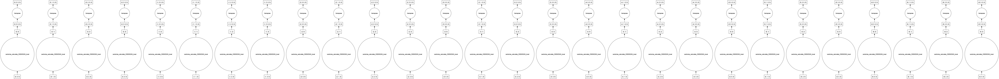

In [171]:
dask.visualize(local_imf_da)

In [172]:
local_imf_da = local_imf_da.compute()

2024-10-03 11:26:57,325 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('vectorize_calculate_CEEMDAN_local-vectorize_calculate_CEEMDAN_local_0-transpose-beb26157c65fcb9ef1575b2285ea857c', 1, 2, 0, 0))" coro=<Worker.execute() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/worker_state_machine.py:3615>> ended with CancelledError
2024-10-03 11:26:57,325 - distributed.worker.state_machine - WARNING - Async instruction for <Task cancelled name="execute(('vectorize_calculate_CEEMDAN_local-vectorize_calculate_CEEMDAN_local_0-transpose-beb26157c65fcb9ef1575b2285ea857c', 4, 1, 0, 0))" coro=<Worker.execute() done, defined at /g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/distributed/worker_state_machine.py:3615>> ended with CancelledError
2024-10-03 11:26:57,326 - distributed.worker.state_machine - WARNING - Async instruction for <Task cance

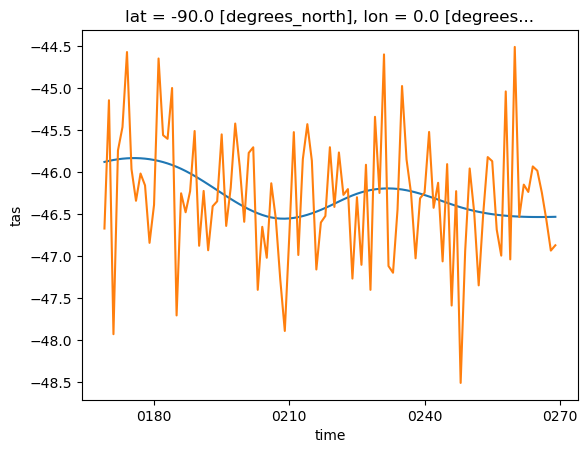

In [314]:
local_imf_da.isel(lat=0, lon=0).sum(dim='imf').plot()
a1_full_data[0].isel(lat=0, lon=0).plot()

# Time Resetting

In [118]:
# np.take(esmpi_data.dim('time', output='dict')['CanESM5'], [0,1,2,-3,-2,-1])

In [119]:
# # Reset to time zero
# a1_anom_data = a1_anom_data(utils.reset_time_to_0_start, parallel_call=True)
# pct_data = pct_resample_data(utils.reset_time_to_0_start, parallel_call=True)
# esmpi_data = esmpi_data(utils.reset_time_to_0_start, parallel_call=True)

In [120]:
# np.take(esmpi_data.dim('time', output='dict')['CanESM5'], [0,1,2,-3,-2,-1])

# Forced Response

TO DO
* Apply pymankendall (local and single point)
* Look at S/N ratio
    * Can be linear and lowess signal
* Pattern correlations between the zec50 and the linear signal
* Is the macdougal method a bad way of estimating the ZEC?
    * Locations where the ZEC is intially really large
 
* Is the change actually more negative, just that the Macdougal method does not take into accout internal variability/ there are shocks at teh start, and this is not considered corretly.
    * Need to fit linear trend to the GMST data series
    * GSMT trend over 50 years and over 100 years

Plots to make 
* Locations of largest shocks (year one temperature anomalies)
* Sample time series of shocks (inc ZEC50, linear trend)
* Contribution to base period average of first 10 vs. last 10 year
* Signal vs. ZEC50
* ZEC50 - signal
* Scatter - shock vs. zec90 - forced 100
* Scatter -  difference between start and end of base vs  zec90 - forced 100

## Plots

In [121]:

# Define custom colormap with white for 0 to 1 and other colors for higher values
def create_custom_cmap():
    # Define color map for non-zero values
    cmap = plt.get_cmap('PuBuGn', len(discrete_levels) - 1)
    # Add white at the start
    colors = [(1, 1, 1)] + list(cmap(i / (len(discrete_levels) - 1)) for i in range(len(discrete_levels) - 1))
    return LinearSegmentedColormap.from_list('custom_cmap', colors)

In [122]:
vm = 3; step=0.5; levels_shock = np.arange(-vm, vm+step, step)

In [123]:
# Get the existing Spectral colormap
cmap = plt.get_cmap('Spectral_r', len(levels_shock))

# Convert the colormap to a list of colors
colors = cmap(np.linspace(0, 1, cmap.N))

# Find the index range corresponding to the values between -0.5 and 0.5
midpoint_low = np.where(levels_shock == -step)[0][0]
midpoint_high = np.where(levels_shock == step)[0][0]

# Replace the colors between these indices with white
colors[midpoint_low:midpoint_high + 2] = [1, 1, 1, 1]  # RGBA for white

# Create a new colormap from the modified list of colors
custom_cmap = ListedColormap(colors)

# Normalize the colormap so that it fits the levels range
norm = plt.Normalize(vmin=-vm, vmax=vm)

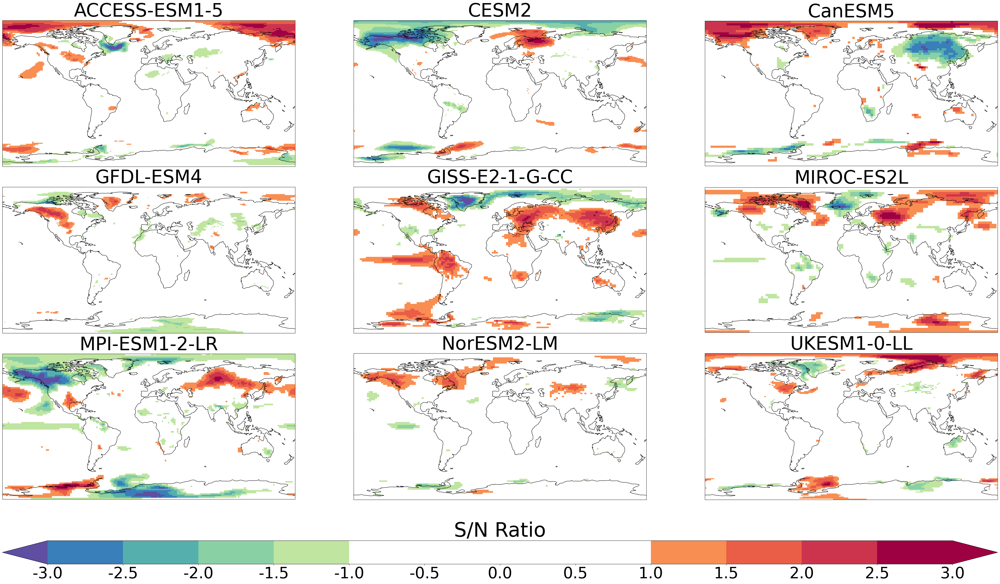

In [124]:
nrows=3; ncols=3
num_plots = nrows*ncols
fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.15], hspace=0.1)
axes = [fig.add_subplot(gs[i], projection=ccrs.PlateCarree()) for i in range(0, num_plots)]
cax = plt.subplot(gs[nrows+1, :])


fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    a1_anom_data.isel(time=0), dim='model', levels=levels_shock, fig=fig, gs=gs, axes=axes,
    cax=cax, cmap=custom_cmap, #'Spectral',
    cbar_title="S/N Ratio", projection=ccrs.PlateCarree, 
    add_label=False, font_scale=2.8, 
    logginglevel='ERROR', ptype='imshow')


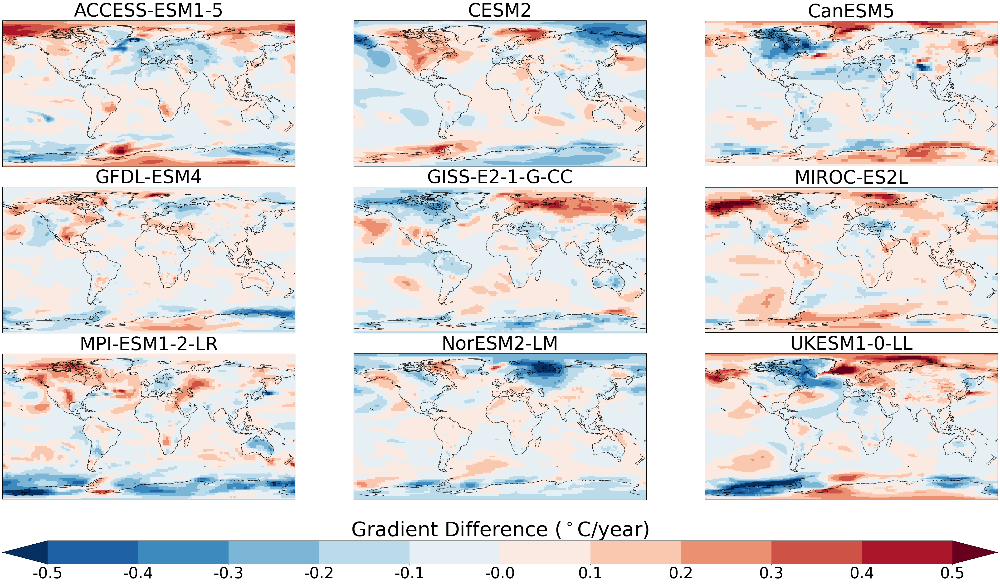

In [125]:
nrows=3; cols=3
fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.15], hspace=0.1)
axes = [fig.add_subplot(gs[i], projection=ccrs.PlateCarree()) for i in range(0, num_plots)]
cax = plt.subplot(gs[nrows+1, :])


vm = .5; step=.1; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    start_end_grad_diff, dim='model', levels=levels_anom, fig=fig, gs=gs, axes=axes, cax=cax,
    cbar_title="Gradient Difference " + r'($^\circ$C/year)', projection=ccrs.PlateCarree, 
    add_label=False, font_scale=2.8, 
    logginglevel='ERROR', ptype='imshow')


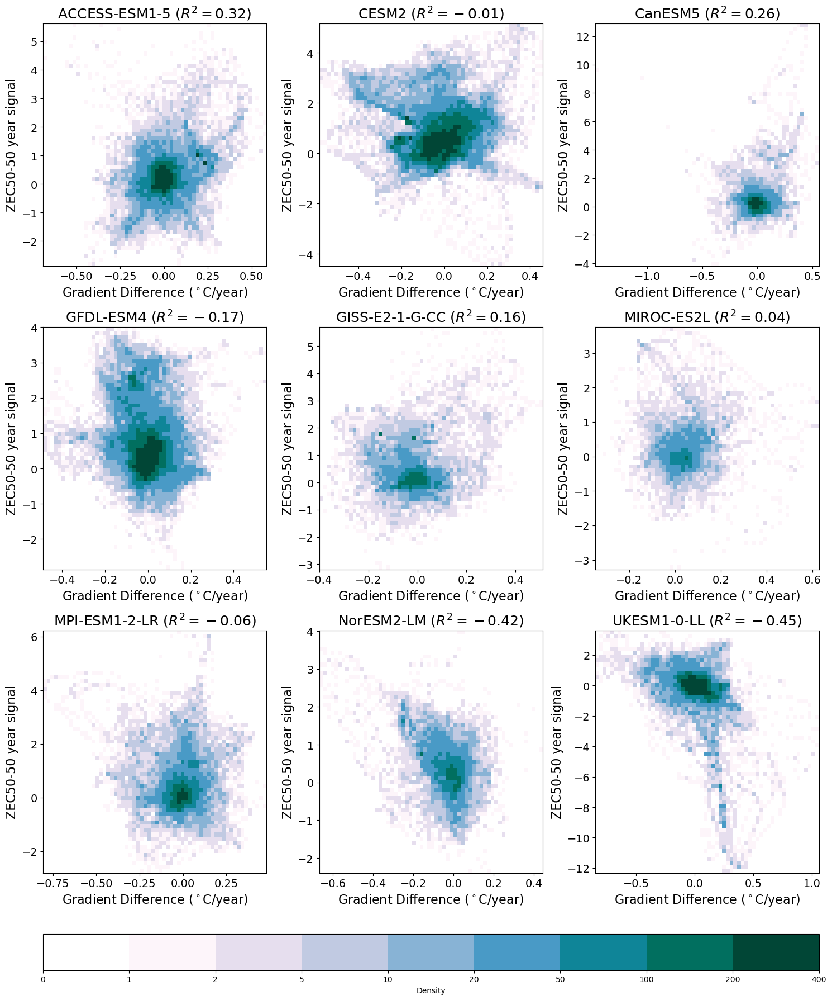

In [126]:
# Define discrete levels
discrete_levels = [0, 1, 2, 5, 10, 20, 50, 100, 200, 400]
cmap = create_custom_cmap()  # Create the custom colormap with white for 0 to 1
norm = BoundaryNorm(discrete_levels, cmap.N)  # Normalize data to the discrete levels

fig = plt.figure(figsize=(15, 18))  # Adjusted figure size
gs = gridspec.GridSpec(4, 3, height_ratios=[1] * 3 + [0.15])
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, model in enumerate(start_end_grad_diff.model):
    ax = axes[num]
    arr1 = start_end_grad_diff[model].values.flatten()
    arr2 = (zec50_data[model] - forced_50_data[model]).values.flatten()
    gradient, _, r2, _, _ = stats.linregress(arr1, arr2)

    hist = ax.hist2d(arr1, arr2, bins=60, cmap=cmap, norm=norm)

    # Update title with r^2 value and gradient
    ax.set_title(f'{model} ($R^2 = {r2:.2f})$', fontsize=18)#, Gradient = {gradient:.2f}')
    ax.set_xlabel("Gradient Difference " + r'($^\circ$C/year)', fontsize=16)
    ax.set_ylabel('ZEC50-50 year signal', fontsize=16)
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)


# Add colorbar in the last row
cbar_ax = fig.add_subplot(gs[-1, :])  # Colorbar subplot spanning the whole last row
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Density')
cbar.set_ticks(discrete_levels)  # Set ticks to match the levels

plt.tight_layout()  # Adjust layout to fit everything

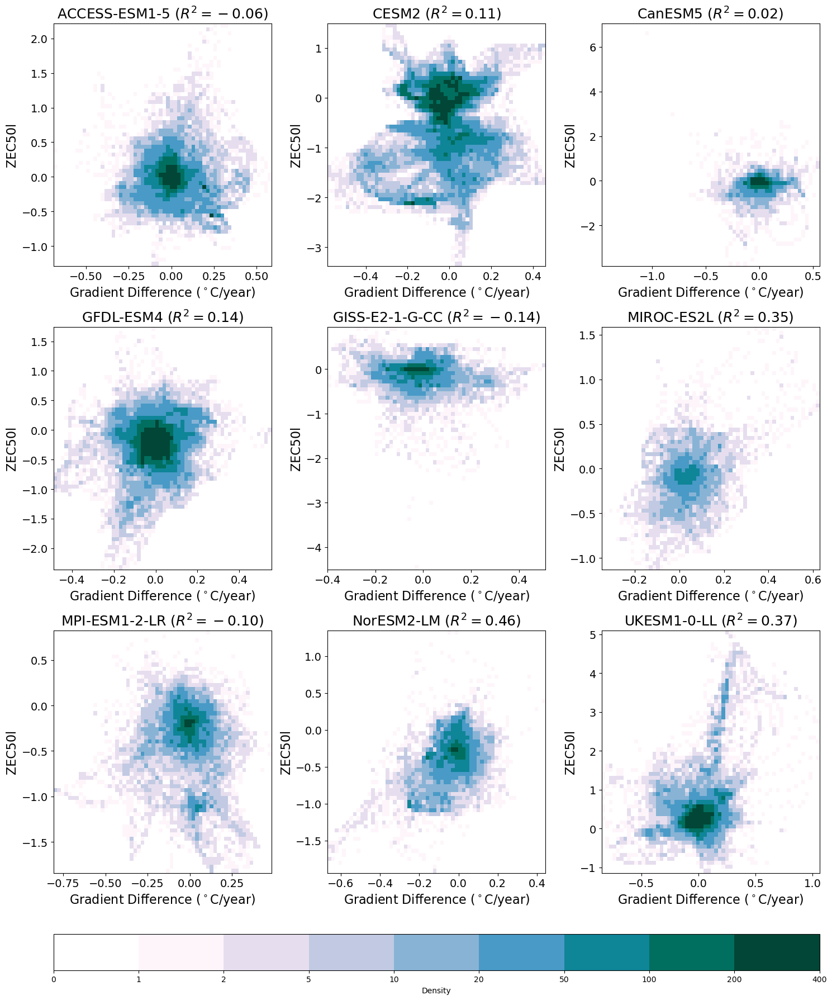

In [127]:
# Define discrete levels
discrete_levels = [0, 1, 2, 5, 10, 20, 50, 100, 200, 400]
cmap = create_custom_cmap()  # Create the custom colormap with white for 0 to 1
norm = BoundaryNorm(discrete_levels, cmap.N)  # Normalize data to the discrete levels

fig = plt.figure(figsize=(15, 18))  # Adjusted figure size
gs = gridspec.GridSpec(4, 3, height_ratios=[1] * 3 + [0.15])
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, model in enumerate(start_end_grad_diff.model):
    ax = axes[num]
    arr1 = start_end_grad_diff[model].values.flatten()
    arr2 = zec50_data[model].values.flatten()
    gradient, _, r2, _, _ = stats.linregress(arr1, arr2)

    hist = ax.hist2d(arr1, arr2, bins=60, cmap=cmap, norm=norm)

    # Update title with r^2 value and gradient
    ax.set_title(f'{model} ($R^2 = {r2:.2f})$', fontsize=18)#, Gradient = {gradient:.2f}')
    ax.set_xlabel("Gradient Difference " + r'($^\circ$C/year)', fontsize=16)
    ax.set_ylabel('ZEC50l', fontsize=16)
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)


# Add colorbar in the last row
cbar_ax = fig.add_subplot(gs[-1, :])  # Colorbar subplot spanning the whole last row
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Density')
cbar.set_ticks(discrete_levels)  # Set ticks to match the levels

plt.tight_layout()  # Adjust layout to fit everything

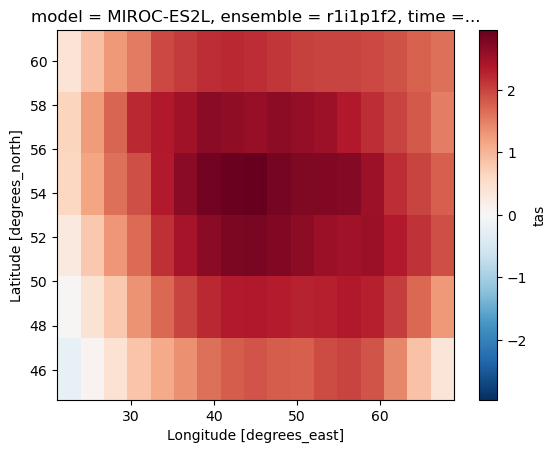

In [128]:
# FInd locations of large shocks
# a1_anom_data[-1].isel(time=0).sel(lat=slice(80, None), lon=slice(50, 100)).plot()

# (a1_anom_data['MPI-ESM1-2-LR']
#  .isel(time=0)
#  .sel(lat=slice(50, 65), lon=slice(220, 240)).plot())


# (a1_anom_data['GISS-E2-1-G-CC']
#  .isel(time=0)
#  .sel(lat=slice(-5, 5), lon=slice(295, 305))
#  .plot()
# )


(a1_anom_data['MIROC-ES2L']
 .isel(time=0)
 .sel(lat=slice(45, 60), lon=slice(20, 70))
 .plot()
)

In [129]:
# a1_anom_data['MPI-ESM1-2-LR'].isel(time=0).sel(lat=57, lon =228, method='nearest')#.values
# a1_anom_data['GISS-E2-1-G-CC'].isel(time=0).sel(lat=-1, lon =301, method='nearest')#.values
a1_anom_data['MIROC-ES2L'].isel(time=0).sel(lat=54, lon =45, method='nearest')#.values

<xarray.DataArray 'tas' (model: 1)> Size: 4B
2.956
Coordinates:
    lat       float64 8B 54.42
    lon       float64 8B 45.0
  * model     (model) <U10 40B 'MIROC-ES2L'
    ensemble  <U8 32B 'r1i1p1f2'
    time      object 8B 1913-12-31 00:00:00

In [130]:
# This location is found to have a really large shock
# THis is for 
model = 'UKESM1-0-LL'
jump_loc = dict(lat=85.5,lon=80, method='nearest')

# model = 'MPI-ESM1-2-LR'
# jump_loc = dict(lat=85.5,lon=80, method='nearest')


# model = 'GISS-E2-1-G-CC'
# jump_loc = dict(lat=-1,lon=301.2, method='nearest')

# model = 'MIROC-ES2L'
# jump_loc = dict(lat=54, lon =45, method='nearest')

In [131]:
a1_subset_fitted = linear_fit_da[model].sel(**jump_loc).squeeze().compute()#.plot()
a1_subset_50_fitted = linear_fit_50_da[model].sel(**jump_loc).squeeze().compute()#.plot()

a1_model_subset = a1_anom_data[model].sel(**jump_loc).squeeze().compute()#.plot()
pct_brach_subset =  branch_point_anom_data[model].sel(**jump_loc).squeeze().compute()
a1_subset_50_slope = forced_50_data[model].sel(**jump_loc).squeeze().compute().values.item()
a1_subset_50_total_fit_slope = forced_50_total_fit_data[model].sel(**jump_loc).squeeze().compute().values.item()

In [132]:
a1_subset_50_slope

10.950099050927134

Text(0.5, 1.0, '85.5$^\\circ$N, 80$^\\circ$E')

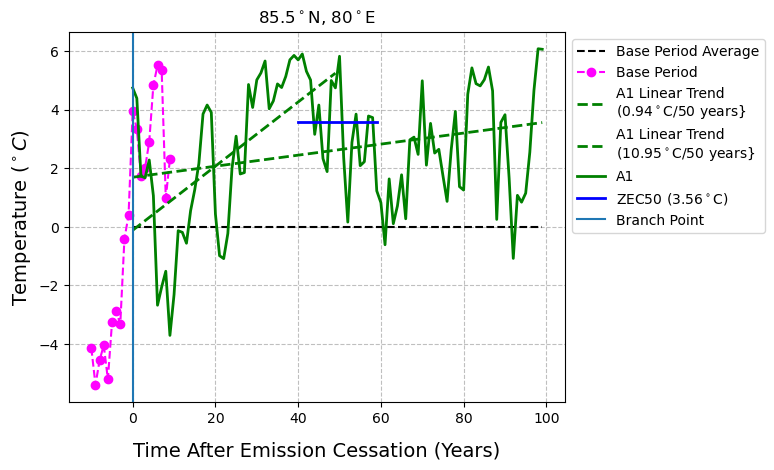

In [133]:
fig = plt.figure()
ax = fig.add_subplot(111)

a1_time = np.arange(0, len(a1_model_subset.time.values))
pct_time = np.arange(-10, 10)

base_period_mean = pct_brach_subset.mean(dim='time').values


ax.plot(
    a1_time,
    np.tile(base_period_mean, len(a1_model_subset.time.values)),
    linestyle='--', color='k', label='Base Period Average')

ax.plot(pct_time, pct_brach_subset.values-base_period_mean, color='magenta', label='Base Period',
       linestyle='--', marker='o')

ax.plot(a1_time, a1_subset_fitted, color='green', linewidth=2, linestyle='--',
        label=f'A1 Linear Trend\n({a1_subset_50_total_fit_slope:.2f}' + r'$^\circ$C/50 years}')

ax.plot(a1_time[:len(a1_subset_50_fitted)], a1_subset_50_fitted, color='green', linewidth=2, linestyle='--',
        label=f'A1 Linear Trend\n({a1_subset_50_slope:.2f}' + r'$^\circ$C/50 years}')

ax.plot(a1_time, a1_model_subset.values, color='green', linewidth=2, label='A1')

zec50_val = zec50_data[model].sel(**jump_loc).values.item() #a1_anom_data[model].sel(**jump_loc).isel(time=slice(40, 60)).mean().values
ax.plot(np.arange(40, 60),
        np.tile(zec50_val, 20),
        color='blue', linewidth=2, label=f'ZEC50 ({zec50_val:.2f}' + r'$^\circ$C)')


ax.axvline(0, label='Branch Point')

ax.legend(ncol=1, bbox_to_anchor=[1, 1])
ax.grid(True, linestyle='--', color='grey', alpha=0.5)
ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);
ax.set_ylabel('Temperature ' + r'($^\circ C$)' , fontsize=14);

ax.set_title(str(jump_loc['lat']) + r'$^\circ$N' + ', ' + str(jump_loc['lon']) + r'$^\circ$E')

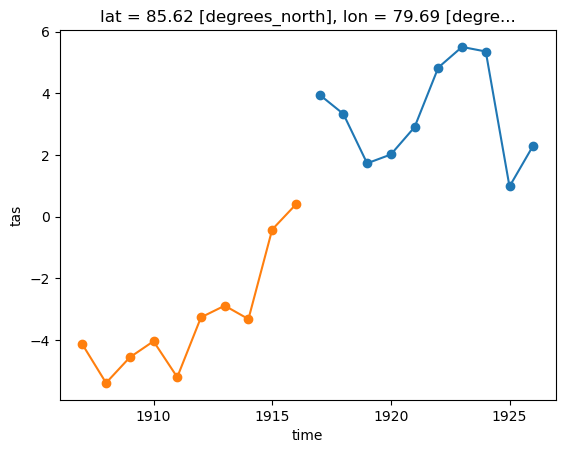

In [134]:
pct_brach_subset.isel(time=slice(10, None)).plot(marker='o')
pct_brach_subset.isel(time=slice(0,10)).plot(marker='o')

In [135]:
calculate_slope(pct_brach_subset.isel(time=slice(10, None)).values)#.mean()

-0.004520297772956623

In [136]:
calculate_slope(pct_brach_subset.values)

0.5596413680485317

In [137]:
calculate_slope(pct_brach_subset.isel(time=slice(0,10)).values)

0.5290126453746449

In [138]:
# nrows=3; cols=3
# fig = plt.figure(figsize=(18*nrows, 10*ncols))
# gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.15], hspace=0.1)
# axes = [fig.add_subplot(gs[i], projection=projection_init) for i in range(0, num_plots)]
# cax = plt.subplot(gs_bottom[nrows+1, :])


# vm = 3; step=.5; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
# fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
#     total_sn, dim='model', levels=levels_anom, fig=fig, gs=gs, axes=axes, cax=cax,
#     cbar_title="S/N Ratio", projection=ccrs.PlateCarree, 
#     add_label=False, font_scale=2.8, 
#     logginglevel='ERROR', ptype='imshow')


In [139]:
nrows=3; cols=3
fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.15], hspace=0.1)
axes = [fig.add_subplot(gs[i], projection=projection_init) for i in range(0, num_plots)]
cax = plt.subplot(gs_bottom[nrows+1, :])


vm = 1.4; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    total_50_signal, dim='model', levels=levels_anom, fig=fig, gs=gs, axes=axes, cax=cax,
    cbar_title="Total Change After 50 years (K)", projection=ccrs.PlateCarree, 
    add_label=False, font_scale=2.8, 
    logginglevel='ERROR', ptype='imshow')


- full garbage collection released 39.39 MiB from 98148 reference cycles (threshold: 9.54 MiB)


NameError: name 'projection_init' is not defined

<Figure size 5400x3000 with 0 Axes>

In [ ]:
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)
nrows=9; ncols=3
fig = plt.figure(figsize=(50, 90))
gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.3]
                       , hspace=0.15, wspace=0.05)
axes_left = [fig.add_subplot(gs[i, 0], projection=projection_init) for i in range(9)]
axes_middle = [fig.add_subplot(gs[i, 1], projection=projection_init) for i in range(9)]
axes_right = [fig.add_subplot(gs[i, 2], projection=projection_init) for i in range(9)]

cax1 = plt.subplot(gs[nrows, :])
# cax2 = plt.subplot(gs[nrows, 2])


triple_plot_kwargs = dict(projection=ccrs.PlateCarree, 
    add_label=False, font_scale=2.8, 
    logginglevel='ERROR', ptype='imshow')

vm = 1.8; step=.2; levels_anom = np.arange(-vm, vm+step, step) 
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    zec90_data, dim='model', levels=levels_anom,
    fig=fig, gs=gs, axes=axes_left, 
    cax=cax1,
    cbar_title="Total Change After 100 years (K)",
    **triple_plot_kwargs)

fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    total_signal, dim='model', levels=levels_anom,
    fig=fig, gs=gs, axes=axes_middle, 
    cax=cax1,
    cbar_title="Total Change After 100 years (K)", 
    **triple_plot_kwargs)


fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    zec90_data-total_signal, dim='model', levels=levels_anom,
    fig=fig, gs=gs, axes=axes_right, cax=cax1,
    cbar_title="Temperature Change/Difference (ZEC90-Forced Response)" + r'($^\circ C$)',
    **triple_plot_kwargs)


for num, (ax1, ax2, ax3) in enumerate(zip(axes_left, axes_middle, axes_right)):
    ax1.annotate(ax1.get_title(), xy=(-0.05, 0.5), xycoords = 'axes fraction',
                 ha='center', va='center', fontsize=60, rotation=90)

    if num == 0:
        ax1.set_title('ZEC90', fontsize=60)
        ax2.set_title('Forced Response', fontsize=60)
        ax3.set_title('ZEC90 - Forced Response', fontsize=60)
    else:
        [ax.set_title('') for ax in [ax1, ax2, ax3]]


In [ ]:
nrows=3; cols=3
fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.15], hspace=0.1)
axes = [fig.add_subplot(gs[i], projection=projection_init) for i in range(0, num_plots)]
cax = plt.subplot(gs_bottom[nrows+1, :])


vm = 1.8; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    zec90_data, dim='model', levels=levels_anom, fig=fig, gs=gs, axes=axes, cax=cax,
    cbar_title="Total Change After 100 years (K)", projection=ccrs.PlateCarree, 
    add_label=False, font_scale=2.8, 
    logginglevel='ERROR', ptype='imshow')


In [ ]:
nrows=3; cols=3
fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.15], hspace=0.1)
axes = [fig.add_subplot(gs[i], projection=projection_init) for i in range(0, num_plots)]
cax = plt.subplot(gs_bottom[nrows+1, :])


vm = 1.8; step=.2; levels_anom = np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    total_signal, dim='model', levels=levels_anom, fig=fig, gs=gs, axes=axes, cax=cax,
    cbar_title="Total Change After 100 years (K)", projection=ccrs.PlateCarree, 
    add_label=False, font_scale=2.8, 
    logginglevel='ERROR', ptype='imshow')


In [ ]:
# signal_100_ds, noise_100_ds ,sn_ratio_100_ds = a1_anom_data(
#     sn_calc.signal_to_noise_ratio,
#     100, 
#     detrended_data=a1_anom_detrend_data
#     , noise_type='static', logginglevel='INFO', return_all=True)

In [ ]:
fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(4, 3, height_ratios=[0.15, 1, 1, 1], hspace=0.4) 

axes =[fig.add_subplot(gs[i+3]) for i in range(9)]
# Create a position for the colorbar on top
cbar_ax = fig.add_subplot(gs[0, :])

# Define levels for the discrete colorbar
levels = np.arange(-2.5, 2.75, 0.25)

# Create a colormap and normalize with the levels
cmap = plt.get_cmap('RdBu_r')
norm = BoundaryNorm(levels, ncolors=cmap.N, clip=True)

# Create subplots
for num, model in enumerate(static_noise_data.model):
    ax = axes[num]
    ax.grid(True, linestyle='--', color='grey', alpha=0.6, zorder=-1000)

    sc = ax.scatter(static_noise_data[model].values.flatten(),
                    year_stable_data[model].values.flatten(), 
                    c=total_signal[model].values.flatten(), cmap=cmap, norm=norm) 
    #zec50_data, stable_anom_da
    ax.set_title(model, fontsize=18)
    ax.set_xlim(0,4)
    ax.set_ylim(0, 60)
    
# Add the colorbar
cbar = fig.colorbar(sc, cax=cbar_ax, orientation='horizontal')
cbar.ax.set_title('Temperature Anomaly at Stabilisation ' + r'$ (^\circ C)$', fontsize=18)

cbar.ax.tick_params(labelsize=16)  # Increase font size of the tick labels

axes[3].set_ylabel('Year of Stabilisation', fontsize=18)
axes[7].set_xlabel('Standard Deviation'  + r'$ (^\circ C)$', fontsize=18)


In [ ]:
# a1_anom_data[model].sel(**lat_lon_dict).rolling(time=20).mean()

In [ ]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
ax2 = fig.add_subplot(212)
lat_lon_dict = dict(lat=80, lon=67.5, method='nearest')

model = 'ACCESS-ESM1-5'
ax1.plot(esmpi_data[model].sel(**lat_lon_dict).isel(time=slice(0,500)).squeeze().values,
        color='green', alpha=0.7, linewidth=1.7,);
ax2.plot(a1_anom_data[model].sel(**lat_lon_dict).squeeze().values,
         color='green', linewidth=1.7, alpha=0.7);

# slope, fitted_line = calculate_slope_and_line(
#     a1_anom_data[model].sel(**lat_lon_dict).squeeze().values)
# ax2.plot(np.arange(len(fitted_line)), fitted_line, 
#         color='black', linewidth=2)

ax2.plot(
    (a1_anom_data[model].sel(**lat_lon_dict).squeeze()
     .rolling(time=20, center=True).mean().values),
color='blue', linewidth=1.7, alpha=0.7, linestyle='--', label='Rolling 20-year mean');

ax2.plot(np.arange(40, 61),
    np.tile(zec50_data[model].sel(**lat_lon_dict).values, 21),
        linewidth=2.5, color='magenta', label='ZEC'+r'$_{50}$')

ax2.plot(np.arange(
    year_stable_data[model].sel(**lat_lon_dict).values,
    year_stable_data[model].sel(**lat_lon_dict).values+21),
    np.tile(stable_anom_da[model].sel(**lat_lon_dict).values, 21),
        linewidth=2.5, color='magenta', linestyle='--', 
        label='Temperature Anomaly at Stabilisation')

ax2.legend(ncol=2, fontsize=12)

plotting_functions.format_axis(
    ax1, xlabel='Time After Simulation Start (Years)', title=f'{model} (75N, 40S)',
    ylabel='GMST'+r' ($^{\circ}C$)',
    labelpad=55, invisible_spines=['top', 'right'])



ax2.yaxis.set_major_locator(mticker.MultipleLocator(1))
ax2.yaxis.set_minor_locator(mticker.MultipleLocator(.5))

plotting_functions.format_axis(
    ax2, xlabel='Time After Emission Cessation (Years)', title='',
    ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
    labelpad=55, invisible_spines=['top', 'right'])

# ax1.set_xticklabels(a1_anom_data.isel(time=slice(14, 60)).time.dt.year.values[::15])

In [ ]:
arr = a1_anom_data[model].sel(**lat_lon_dict).squeeze().values
arr.shape

In [ ]:
window = 30
signal_list = []
noise_list = []
for t in range(len(arr)-window):
    arr_subset = arr[t:t+window]
    slope = calculate_slope(arr_subset) * window
    noise = np.std(arr_subset)
    signal_list.append(slope)
    noise_list.append(noise)
signal_list = np.array(signal_list)
noise_list = np.array(noise_list)
sn_list = signal_list/noise_list

In [ ]:
actual_values = sn_ratio_a1_data.sel(model=model).sel(**lat_lon_dict).sel(window=window).squeeze().values

In [ ]:
a1_anom_detrend_data.sel(model=model).sel(**lat_lon_dict).plot()
a1_anom_data.sel(model=model).sel(**lat_lon_dict).plot()

In [ ]:
# plt.plot(actual_values)
plt.plot(sn_list, label='test')
plt.plot(actual_values, label='actual')
plt.legend()

In [ ]:
diff_stable_and_zec50_data = zec50_data - stable_anom_da

In [ ]:
fig = plt.figure(figsize=(18*nrows, 10*ncols))
gs = gridspec.GridSpec(nrows+2, ncols, height_ratios=[1]*nrows+[0.1]+[0.15], hspace=0.1)
axes = [fig.add_subplot(gs[i], projection=projection_init) for i in range(0, num_plots)]
cax = plt.subplot(gs_bottom[nrows+1, :])


vm = 1.5; step=.3; levels_diff= np.arange(-vm, vm+step, step) # based upon 99th percentile of abs.
fig, gs, axes, cbar = sn_plotting.map_plot_all_for_coords_3(
    diff_stable_and_zec50_data, dim='model', levels=levels_diff, fig=fig, gs=gs, axes=axes, cax=cax,
    cbar_title="ZEC" + r'$_{50}$' + ' - Temperature Anomaly at Stabilisation ' + r'$(^\circ C)$', 
    projection=ccrs.PlateCarree, 
    add_label=False, font_scale=2.8, 
    logginglevel='ERROR', ptype='imshow')


# TCRE local ZEC correlation

In [ ]:
from scipy.stats import spearmanr

In [ ]:
def apply_correlation(arr1, arr2):
    if np.all(np.isnan(arr1)) or np.all(np.isnan(arr2)): return np.nan

    finite_locs = np.isfinite(arr1)
    arr1 = arr1[finite_locs]
    arr2 = arr2[finite_locs]

    return spearmanr(arr1, arr2).statistic

In [ ]:
list(tcre_dict.values())

In [ ]:
apply_correlation_tcre = partial(apply_correlation, arr2=np.array(list(tcre_dict.values())))
tcre_correlation = xr.apply_ufunc(
    apply_correlation_tcre,
    stable_anom_da.sel(model=list(tcre_dict)), # make sure same order
    input_core_dims=[['model']], 
    output_core_dims=[[]],
    vectorize=True
)

In [ ]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
tcre_correlation.plot(ax=ax, levels=np.arange(-1, 1.1, .1))
ax.coastlines()

In [ ]:
apply_correlation_ecs = partial(apply_correlation, arr2=np.array(list(ecs_dict.values())))
ecs_correlation = xr.apply_ufunc(
    apply_correlation_ecs,
    stable_anom_da.sel(model=list(tcre_dict)), # make sure same order
    input_core_dims=[['model']], 
    output_core_dims=[[]],
    vectorize=True
)

In [ ]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection=ccrs.PlateCarree())
ecs_correlation.plot(ax=ax, levels=np.arange(-1, 1.1, .1))
ax.coastlines()

In [ ]:
stable_anom_da.sel(model=list(tcre_dict))

# Drift Comparison (Figure S11)

In [ ]:
#### TODO: Do not import as *. Add drift_functino. as prefix to all necissary functions
from drift_functions import *

In [ ]:
# P-values
pi_pval_da = calculate_pvals(
    esmpi_data.chunk({'time':-1, 'model':1, 'lat': int(96/4)}).isel(time=slice(0, 100)))

In [ ]:
a1_anom_data

In [ ]:
exp_pval_da = calculate_pvals(a1_anom_data)

In [ ]:
exp_pval_da.isel(model=0).plot()

In [ ]:
# Just the p-values that are less tha 0.05
pi_sig_da = xr.where(pi_pval_da < 0.05, 1, np.nan)#.astype(int)
exp_sig_da = xr.where(exp_pval_da < 0.05, 1, np.nan)#.astype(int)

In [ ]:
fig = plt.figure(); ax = fig.add_subplot(111, projection=ccrs.Robinson())
sn_plotting.plot_stippled_data(pi_sig_da.isel(model=0), ax)

In [ ]:
# Calculating the gradient over the 100 year run length
gradient_exp_full_da = calculate_trend(a1_anom_data);
gradient_pi_full_da = calculate_trend(esmpi_data.isel(time=slice(0, 100)))

In [ ]:
# Multiplying gradient by 50 to get K per 50 years
gradient_exp_full_da = (gradient_exp_full_da*50).persist()
gradient_pi_full_da = (gradient_pi_full_da*50).persist()

In [ ]:
# Difference in the gradients
gradient_full_diff = gradient_exp_full_da-gradient_pi_full_da

In [ ]:
reload(sn_plotting)

In [ ]:
# All mean value plots
models = gradient_full_diff.model.values
nrows = len(models); ncols = 3
fig = plt.figure(figsize=(6*ncols, 8*ncols))
gs = gridspec.GridSpec(nrows+1, ncols, height_ratios = [1]*nrows +[0.2], hspace=.2, wspace=0)
projection = ccrs.PlateCarree(central_longitude=int(np.mean(gradient_full_diff.lon.values)))

drift_plot_levels = np.arange(-1.4, 1.4, .2)
drift_plot_kwargs = dict(levels=drift_plot_levels, extend='both', cmap='RdBu_r', add_label=False, font_scale=0.7)
vm =40; step=5; levels_mean_stab2 = np.arange(0, vm+step, step)
all_axes = []

### A1

fig, gs, axes1 = sn_plotting.map_plot_all_for_coords_3(
    gradient_exp_full_da, dim='model',
    fig=fig, gs=gs, add_colorbar=False, stipling_da=exp_sig_da,
    axes = [fig.add_subplot(gs[i, 0], projection=projection) for i in range(len(models))],
    **drift_plot_kwargs)

for num, (ax, model) in enumerate(zip(axes1, models)):
    # ax.set_ylabel(model, labelpad=500)
    # sn_plotting.plot_stippled_data(pi_sig_da.sel(model=model), ax) # TODO: This is not working in the `map_plot_all_for_coords_3` function
    if num == 0: ax.set_title('A1 Experiment', fontsize=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
    else: ax.set_title('')
    
y_axis_kwargs = dict(xy=(-.25, 0.5), ha='center', va='center', xycoords='axes fraction', rotation=0,
                     size=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
for model, ax in zip(models, axes1): ax.annotate(model, **y_axis_kwargs)
all_axes.extend(axes1)


#### Pi-control

fig, gs, axes2 = sn_plotting.map_plot_all_for_coords_3(
    gradient_pi_full_da, dim='model',
    fig=fig, gs=gs, add_colorbar=False,stipling_da=pi_sig_da, 
    axes = [fig.add_subplot(gs[i, 1], projection=projection) for i in range(len(models))],
    **drift_plot_kwargs)
for ax in axes2: ax.set_title('')
axes2[0].set_title('Pre-Industrial Control', size=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])

all_axes.extend(axes2)

### Diff

fig, gs, axes3, cbar = sn_plotting.map_plot_all_for_coords_3(
    gradient_full_diff, dim='model',
    cbar_title="Gradient (K /(50 year))", fig=fig, gs=gs,
    axes = [fig.add_subplot(gs[i, 2], projection=projection) for i in range(len(models))],
    cax = plt.subplot(gs[nrows, :]), 
    **drift_plot_kwargs)


for ax in axes3: ax.set_title('')
axes3[0].set_title('Difference', size=plotting_functions.PlotConfig.title_size*drift_plot_kwargs['font_scale'])
all_axes.extend(axes3)

#for num, ax in enumerate(all_axes): plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.7)